<a href="https://colab.research.google.com/github/fluderm/hangman/blob/main/Deep_Q_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import json
import requests
import random
import string
import secrets
import time
import re
import collections
try:
    from urllib.parse import parse_qs, urlencode, urlparse
except ImportError:
    from urlparse import parse_qs, urlparse
    from urllib import urlencode
    
    
#myimports:

import pandas as pd
import numpy as np
import random

# Create Training and Test Data

In [3]:
text_file = open('words_250000_train.txt',"r")
full_dictionary = text_file.read().splitlines()
text_file.close()

In [4]:
alt_dict=pd.read_csv('words_pos.csv')
alt_dict_words=alt_dict['word'].to_numpy()
alt_dict_words.sort()

train_words=full_dictionary
train_words.sort()

In [5]:
test_words1=[]

foundprev=0
for count,altword in enumerate(alt_dict_words):
    j=0
    while train_words[foundprev+j]<altword: j+=1
        
    if train_words[foundprev+j]==altword: foundprev=foundprev+j
    else: test_words1.append(altword)
    
#    if count%(len(alt_dict_words)/10)==0 and count>0:
#        print(count/len(alt_dict_words),' done', end = "\r")

#test_wordsnp=np.array(test_words1)

In [6]:
with open("test_words.txt", 'w') as file:
    for row in test_words1:
        s = "".join(map(str, row))
        file.write(s+'\n')

# Auxiliary stuff

In [7]:
letthsh={chr(i+97):0 for i in range(0,26)}

for word in full_dictionary:
    for letter in set(word):
        letthsh[letter]+=1
        
totletts=sum(letthsh[letter] for letter in letthsh)

for letter in letthsh:
    letthsh[letter]/=totletts

sorted_overall=[(letter,letthsh[letter]) for letter in letthsh]
sorted_overall.sort(key=lambda x:x[1],reverse=True)

alphabet={chr(i+97) for i in range(0,26)}

# Create Hangman Environment

In [64]:
class Hangman(object) :
    def __init__(self , 
                 word_src, 
                 max_lives = 6 , 
                 win_reward = 10,
                 correct_reward = 1,
                 repeated_guessing_penalty = -100,
                 lose_reward = -10, 
                 false_reward = -1,
                 verbose = False,
                 alpha = .6) :
        if type(word_src) == list :
            self.words = word_src
        else :
            with open(word_src, 'r') as f :
                self.words = f.read().splitlines()
        self.max_lives = max_lives
        self.win_reward = win_reward
        self.correct_reward = correct_reward
        self.lose_reward = lose_reward
        self.false_reward = false_reward
        self.verbose = verbose
        self.repeated_guessing_penalty = repeated_guessing_penalty
        self.current_dictionary = []
        self.alt_dict=False
        self.score_hash={chr(i+97):0 for i in range(0,26)}
        self.alpha=alpha
        self.c_past=[]
        self.false_guesses_p=[]
        
    def pick_random(self) :
        self.guess_word = np.random.choice(self.words)
        
    def reset(self) :
        self.curr_live = self.max_lives
        self.pick_random()
        self.guessing_board = ['_' for i in range(len(self.guess_word))]
        self.correct_guess = 0
        self.guessed = []
        self.done = False
        self.alt_dict = False
        if self.verbose :
            print('Game Starting')
            print(f'Current live : {self.curr_live: .2f}')
        return self.show_gameboard()
        

    def show_gameboard(self) :
        board = ''.join(self.guessing_board)
        if self.verbose:
            print(board)
            print()
        return board
        
    def step(self, letter) :
        if not(letter.isalpha()) :
            raise TypeError('Can only accept alphabet')
        letter = letter.lower()

        if letter not in self.guessed :
            self.guessed.append(letter)
        else :
            if self.verbose :
                print('Letter already used')
            return self.show_gameboard(), self.repeated_guessing_penalty, self.done, {}

        if letter in self.guess_word :
            for i in range(len(self.guess_word)) :
                if letter == self.guess_word[i] :
                    self.guessing_board[i] = letter
                    self.correct_guess += 1
            if self.correct_guess == len(self.guess_word) :
                self.done = True
                if self.verbose :
                    print('You Win')
                    print('Word is', self.guess_word)
                return self.guess_word, self.win_reward, self.done, {'ans' : self.guess_word}
            else :                
                return self.show_gameboard(), self.correct_reward, self.done, {}
        else :
            self.curr_live -= 1
            if self.curr_live == 0 :
                self.done = True
                if self.verbose :
                    print('You Lose')
                    print('Word is', self.guess_word)
                return self.show_gameboard(), self.lose_reward, self.done, {'ans_missed' : self.guess_word}
            else :
                if self.verbose :
                    print('Current lives :', self.curr_live)
                return self.show_gameboard(), self.false_reward, self.done, {}

    #------------------------------------------------------------------------------------------
    # "hardcoded" guessing (pattern-matching approach based on train dictionary):
    # Achieve ~60% success rate on test dictionary.
    def guess(self, word): # word input example: "_pp_e"
        
        # identify false guesses
        false_guesses=''
        for letter in self.guessed:
            if letter in set(word): continue
            else: false_guesses=''.join([false_guesses,letter])

        if false_guesses=='':
            false_guesses_re='.'
        else:
            false_guesses_re='[^'+false_guesses+']'
        
        len_word = len(word)
        
        #First guess:
        if len(self.guessed)==0:
            #get frequency of letters of all words of given length in dictionary
            lett_hash_by_length={chr(i+97):0 for i in range(0,26)}
            full_dict_by_length=[]

            for w in full_dictionary:
                if len(w)==len_word: full_dict_by_length.append(w)
            
            for w in full_dict_by_length:
                for letter in set(w):
                    lett_hash_by_length[letter]+=1
            
            self.sorted_by_length=[(letter,lett_hash_by_length[letter]) for letter in lett_hash_by_length]
            self.sorted_by_length.sort(key=lambda x:x[1],reverse=True)
            
            #define current dictionary
            self.current_dictionary = full_dictionary
            
            #Guess first letter based on fq in words with given length:
            return (self.sorted_by_length[0][0])
        
        # identify found first/last letter:
        word_list=list(word)
        first_non_u=0
        for lett in word_list:
            if lett=='_': first_non_u+=1
            else: break
        
        last_non_u=len(word_list)-1
        for i in range(last_non_u,first_non_u,-1):
            if lett=='_': last_non_u-=1
            else: break
                
        new_dictionary = []
        new_dictionary_set=[]
                
        #focus on found longest pattern (independent of length), as this allows for composite words
        clean_word = word[first_non_u:last_non_u+1:1].replace("_",false_guesses_re)
        clean_word = '^.*?'+clean_word

        def intersection_length(l1, l2):
            return sum(1 if item in l2 else 0 for item in l1)
        
        def find_in_full_dict(lst,max_length=10000):
            #uncomment if we want to randomely pick pattern
            #random.shuffle(lst)
            for patt in lst:
                new_clean_word = '^.*?'+patt.replace("_",false_guesses_re)
                for w in full_dictionary:
                    if re.match(new_clean_word,w):
                        new_dictionary.append(w)
                        new_dictionary_set.append("".join(set(w)))
                if len(new_dictionary)>max_length:
                        return
        
        #for strategies based on letters remaining in word:
        #perc_missing=intersection_length(word, '_'*len(word))/len(word)
        
        #if dictionary gets sufficiently small, find similar words with smaller and smaller patterns:
        if len(self.current_dictionary)<3000: self.alt_dict=True                
        
        if self.alt_dict:
            length_of_pattern=(last_non_u+1)-first_non_u-1
            while len(new_dictionary)<100:
                word0='_'+word[first_non_u:last_non_u+1:1]+'_'
                len_word0=len(word0)
                clean_words=[]
                
                for i in range(len_word0-length_of_pattern):
                    if intersection_length(word0[i:i+length_of_pattern],'_'*length_of_pattern)<=length_of_pattern//2:
                        clean_words.append(word0[i:i+length_of_pattern])

                find_in_full_dict(clean_words)
                length_of_pattern=length_of_pattern-1
        else:
            #If we have no match so far, go down the list of most frequent letters in words of given length
            if len(self.guessed)==len(false_guesses):
                for letter, fq in self.sorted_by_length:
                    if letter not in self.guessed:
                        return letter
            else:
                for w in self.current_dictionary:
                    if re.match(clean_word,w):
                        new_dictionary.append(w)
                        new_dictionary_set.append("".join(set(w)))

        #If we have found enough letters, can we exploit
        #frequency of letters for words in dictionary 
        #pre, mid, or post a pattern:
        #find dense patterns of length =4:
        def list_of_tup_to_string(listoftup):
            tot=''
            for x in listoftup:
                for y in x:
                    tot+=y
            return tot
            
        length_pattern=4
        all_patt=[]
        #remove short pattern matching:
        for i in range(len_word-length_pattern+1):
            is_len=intersection_length(word[i:i+length_pattern],"_"*length_pattern)
            if is_len<=length_pattern/4 and is_len>0:
                xpat=(word[max(i-1,0):min(i+length_pattern+1,len_word)].replace('__','_'))
                k=0
                while k+4<=len(xpat):
                    all_patt.append(xpat[k:k+4].replace("_",'(.?)'))
                    k+=1

        if all_patt!=[]:
            all_patt=set(all_patt)
            pattern_letters=[]
            dict0=new_dictionary
            for w in dict0:
                for patt in all_patt:
                    pattern_letters+=list_of_tup_to_string(re.findall(patt,w))
                    
            #Fq of letters within short patterns:
            c_patt=collections.Counter(pattern_letters)
            sorted_patt_count = c_patt.most_common()
                    
        self.current_dictionary = new_dictionary

        #Now set up choice of letter:
        full_dict_string = "".join(new_dictionary_set)
        
        #Fq of letters in dictionary created by "long" patterns:
        c = collections.Counter(full_dict_string)
        sorted_letter_count = c.most_common() 
        
        #weighting of frequencies btw short and long patterns:
        def counter_mult(ctr,nmbr):
            for lttr in ctr.keys():
                ctr[lttr]=ctr[lttr]*nmbr
            return ctr
        
        guess_letter = '!'
        #if we have short patterns:
        #use counter_mult if we want to weigh on set over the other:
        #Here we first only pick the short algorithms-letters if they exist
        if all_patt!=[]:
            c_joint=c_patt #+c
            sorted_c_joint=c_joint.most_common()
            for letter,instance_count in sorted_c_joint:
                if letter not in self.guessed:
                    guess_letter = letter
                    break
        
        #if not enough information for short patterns, we use long patterns:
        if guess_letter == '!':        
            for letter,instance_count in sorted_letter_count:
                if letter not in self.guessed:
                    guess_letter = letter
                    break
        
        #if current dictionary not enough use past dictionary:
        if guess_letter == '!':
            for letter,instance_count in self.c_past:
                if letter not in self.guessed:
                    guess_letter = letter
                    break    

        #if still no result, use overall fq of letters in words of give length
        if guess_letter == '!':    
            for letter,instance_count in sorted_overall:
                if letter not in self.guessed:
                    guess_letter = letter
                    break     

        self.c_past=sorted_letter_count

        return guess_letter
    

## Baseline:

Here we execute the env.guess function to guess the next letter. It's a combination of long and short pattern matching for the word within the given training dictionary. It consistently achieves over 60% test accuracy (though is relatively slow since it continuously creates and checks against a specific sub-dictionary from the full training dictionary (which I confusingly call full_dictionary).

In [66]:
env = Hangman('test_words.txt',max_lives = 6, verbose = False)

In [76]:
wins,losses=0,0
tot_games=100

for i in range(tot_games):
  word = env.reset()
  done = False

  while not done:
    word,reward,done,_ = env.step(env.guess(word))
  
  if reward==10:
    wins+=1
  else:
    losses+=1
  print('\r',wins,losses,i+1, end='  ')

print(wins/tot_games,losses/tot_games)

 71 29 100  0.71 0.29


# Reinforcement Learning Setup

In [77]:
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# TensorFlow ≥2.0 is required
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.0"

if not tf.config.list_physical_devices('GPU'):
    print("No GPU was detected. CNNs can be very slow without a GPU.")
    
# Common imports
import numpy as np
import os

# to make this notebook's output stable across runs
np.random.seed(42)
tf.random.set_seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

## Preprocess Input

In [78]:
max_len=0
for word in full_dictionary:
    if len(word)>max_len:
        max_len=len(word)
for word in test_words1:
    if len(word)>max_len:
        max_len=len(word)

In [79]:
#NB: - Cutting off the end pieces of very long words -- maybe there is a better way of dealing with this
#    - We are assuming the input is alphabetical except for the _. Maybe account for other input too.

def state_to_input(stat,max_length=max_len):
    inp=[ord(i.lower())-96 if i.isalpha() else 27 for i in stat]
    while len(inp)<max_length:
        inp.append(0)
    return inp[:min(len(inp),max_length)]

In [80]:
letters=[chr(i+ord('a')) for i in range(26)]

In [81]:
def guess_to_input(guess):
    return [1 if i in guess else 0 for i in letters]

## Setup the Neural Network

In [82]:
keras.backend.clear_session()
#np.random.seed(42)
#tf.random.set_seed(42)

In [83]:
# Guessed_input layers

guessed_inputs = keras.Input(shape=(26,))
guessed_feature = keras.layers.Dense(60, activation='elu',name='guess1')(guessed_inputs)
guessed_feature = keras.layers.Dense(60, activation='tanh',name='animmal')(guessed_feature)

guessed_model = keras.Model(guessed_inputs, guessed_feature, name='guessed')

# State_input layers

max_length=max_len

state_inputs = keras.Input(shape=(max_length,))
state_feature = keras.layers.Embedding(max_length,128, mask_zero = True)(state_inputs)
state_feature = keras.layers.Bidirectional(keras.layers.LSTM(128 , return_sequences=True))(state_feature)
state_feature = keras.layers.Bidirectional(keras.layers.LSTM(128 , return_sequences=True))(state_feature)
state_feature = keras.layers.GlobalAveragePooling1D()(state_feature)
state_feature = keras.layers.Dense(100, activation = 'tanh', name='final')(state_feature)

state_model = keras.Model(state_inputs,state_feature , name = 'state')

# Final Layers

inputs = keras.layers.Concatenate()([state_model.output, guessed_model.output])
feature = keras.layers.Dense(100, activation = 'elu')(inputs)
feature = keras.layers.Dense(26, activation = 'softmax')(feature)

# Full Model

full_model = keras.Model([state_model.input, guessed_model.input], feature, name = 'fullmodel')
full_model.compile(loss = 'categorical_crossentropy', optimizer = keras.optimizers.Adam(1e-3, clipnorm=1))

In [84]:
full_model.summary()

Model: "fullmodel"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 31)]         0           []                               
                                                                                                  
 embedding (Embedding)          (None, 31, 128)      3968        ['input_2[0][0]']                
                                                                                                  
 bidirectional (Bidirectional)  (None, 31, 256)      263168      ['embedding[0][0]']              
                                                                                                  
 bidirectional_1 (Bidirectional  (None, 31, 256)     394240      ['bidirectional[0][0]']          
 )                                                                                        

# Deep Q-Network (DQN)

In [85]:
from collections import deque

alphabet=[chr(i+97) for i in range(0,26)]
n_outputs=26

In [117]:
def epsilon_greedy_policy(obs,guessed_letters, epsilon=0):
    if np.random.rand() < epsilon:
        return alphabet[np.random.randint(n_outputs)]
    else:
        inp1=np.array([state_to_input(obs)])
        inp2=np.array([guess_to_input(guessed_letters)])
        Q_values = full_model.predict([inp1,inp2],verbose=0)
        sorted_Q_values=np.argsort(-np.array(Q_values))[0]
        for it in sorted_Q_values:
            if alphabet[it] not in guessed_letters:
                Q_values_guess=alphabet[it]
                break
        return Q_values_guess

In [118]:
replay_memory = deque(maxlen=2000)

In [119]:
def sample_experiences(batch_size):
    indices = np.random.randint(len(replay_memory), size=batch_size)
    batch = [replay_memory[index] for index in indices]
    states, guessed_lett, actions, rewards, next_states, next_guessed, dones = [
        np.array([experience[field_index] for experience in batch])
        for field_index in range(7)]
    return states, guessed_lett, actions, rewards, next_states, next_guessed, dones

In [120]:
def play_one_step(env, obs, guessed_letters, epsilon):
    gl = guessed_letters[:]
    action = epsilon_greedy_policy(obs, guessed_letters, epsilon)
    next_state, reward, done, info = env.step(action)
    next_guessed = env.guessed
    replay_memory.append((obs, gl, action, reward, next_guessed, next_state, done))
    return next_state, next_guessed, reward, done, info

In [165]:
batch_size = 32
discount_rate = 0.95
optimizer = keras.optimizers.Adam(learning_rate=1e-1)
loss_fn = keras.losses.mean_squared_error

full_model.compile(loss = 'categorical_crossentropy', optimizer = optimizer)

def training_step(batch_size):
    experiences = sample_experiences(batch_size)
    states, guessed_lett, actions, rewards, next_states, next_guessed, dones = experiences
    
    next_inp1=np.array([state_to_input(next_state) for next_state in next_states])
    next_inp2=np.array([guess_to_input(next_guess) for next_guess in next_guessed])
    next_Q_values = full_model.predict([next_inp1, next_inp2],verbose=0)
    
    max_next_Q_values = np.max(next_Q_values, axis=1)
    target_Q_values = (rewards +
                       (1 - dones) * discount_rate * max_next_Q_values)
    target_Q_values = target_Q_values.reshape(-1, 1)

    actions_inp = np.array([ord(action)-97 for action in actions])
    mask = tf.one_hot(actions_inp, n_outputs)
    
    with tf.GradientTape() as tape:
        all_Q_values = full_model([next_inp1,next_inp2])
        Q_values = tf.reduce_sum(all_Q_values * mask, axis=1, keepdims=True)
        loss = tf.reduce_mean(loss_fn(target_Q_values, Q_values))
    grads = tape.gradient(loss, full_model.trainable_variables)
    optimizer.apply_gradients(zip(grads, full_model.trainable_variables))
    return loss

In [166]:
# More lives, more to learn:

env = Hangman('words_250000_train.txt' , max_lives = 10, verbose = False)

#env.seed(42)
#np.random.seed(42)
#tf.random.set_seed(42)

rewards,losses,best_score = [],[],0

Episode: 50, Reward: -14, Mean last 100 Rewards: -15.28, Loss: 0.000, Mean last 100 Losses: nan, eps: 0.00                               

<ipython-input-119-c9036c019d7f>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([experience[field_index] for experience in batch])


Episode: 1000, Last 100 Rewards: -13.82, Last 1000 Rewards: -13.86, Last 100 Losses: 6.790, Last 1000 Losses: 8.572            


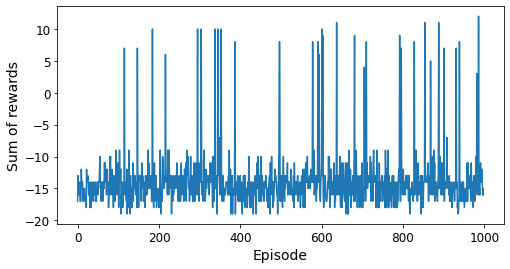

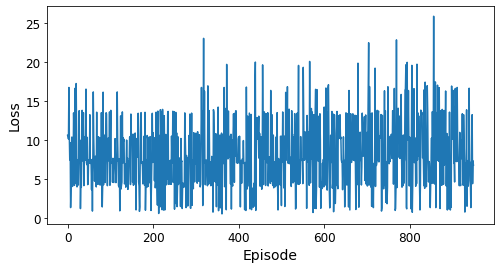

Episode: 2000, Last 100 Rewards: -15.07, Last 1000 Rewards: -14.16, Last 100 Losses: 7.027, Last 1000 Losses: 8.751            


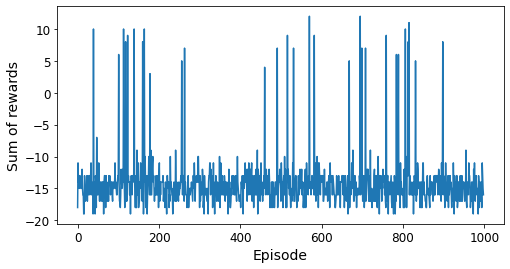

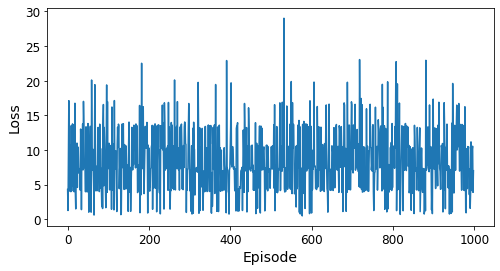

Episode: 2026, Reward: -14, Mean last 100 Rewards: -15.24, Loss: 10.096, Mean last 100 Losses: 8.822, eps: 0.00                               

KeyboardInterrupt: ignored

In [168]:
for episode in range(10000):
    obs = env.reset()    
    rew_per_ep=0
    for step in range(40):
        epsilon = 0# max(1 - episode / 500, 0)
        obs, guessed, reward, done, info = play_one_step(env, obs, env.guessed, epsilon)
        rew_per_ep+=reward
        if done:
            break
    rewards.append(rew_per_ep) 
#    if step >= best_score:
#        best_weights = full_model.get_weights()
#        best_score = step
    loss=0
    if episode > 50:
        loss=training_step(batch_size)
        losses.append(loss.numpy())
        
    print('\r','\rEpisode: {}, Reward: {}, Mean last 100 Rewards: {:.2f}, Loss: {:.3f}, Mean last 100 Losses: {:.3f}, eps: {:.2f}'\
    '            '.format(episode, rew_per_ep, np.mean(rewards[-100:]), loss, np.mean(losses[-100:]), epsilon),\
                  end="                   ") 
    if episode>0 and episode%1000==0:
      
      print('\r','\rEpisode: {}, Last 100 Rewards: {:.2f}, Last 1000 Rewards: {:.2f}, Last 100 Losses: {:.3f}, Last 1000 Losses: {:.3f}'\
    '            '.format(episode, np.mean(rewards[-100:]), np.mean(rewards[-1000:]), loss, np.mean(losses[-100:]), np.mean(losses[-1000:])),\
                  end="") 
      print()

      plt.figure(figsize=(8, 4))
      plt.plot(rewards[-999:])
      plt.xlabel("Episode", fontsize=14)
      plt.ylabel("Sum of rewards", fontsize=14)
      plt.show()

      plt.figure(figsize=(8, 4))
      plt.plot(losses[-999:])
      plt.xlabel("Episode", fontsize=14)
      plt.ylabel("Loss", fontsize=14)
      plt.show()

      
            
#full_model.set_weights(best_weights)

## Test:

In [171]:
wins,losses,games=0,0,0
env = Hangman('test_words.txt'\
              , max_lives = 10, verbose = False)

remguess,totwin,words=[],[],[]
overall_rwd,tot_trials=0,100

for i in range(tot_trials):
    done = False
    obs = env.reset()
    j=0
    tot_rwd=0
    while not done and j<40:
        j+=1
        inp1=np.array([state_to_input(obs)])
        inp2=np.array([guess_to_input(env.guessed)])
        action_proba = full_model([inp1,inp2])
        sorted_proba=np.argsort(-np.array(action_proba))[0]
        for it in sorted_proba:
            if alphabet[it] not in env.guessed:
                action_guess=alphabet[it]
                break 
        obs, rwd , done , wrd = env.step(action_guess)
        tot_rwd+=rwd

    if rwd==10: wins+=1
    if rwd==-10: losses+=1
    games+=1
    print('\r   Games: {}, Wins: {}, Losses: {}, Win percentage: {:.3f}\
        '.format(games,wins,losses,wins/games), end="")

   Games: 100, Wins: 2, Losses: 98, Win percentage: 0.020        

# Double DQN

## Define Target Network:

In [172]:
target = keras.models.clone_model(full_model)
target.set_weights(full_model.get_weights())

## Setup Training:

In [175]:
batch_size = 32
discount_rate = 1
optimizer = keras.optimizers.Adam(learning_rate=1e-2)
loss_fn = keras.losses.Huber() #keras.losses.mean_squared_error

def training_step(batch_size):
    experiences = sample_experiences(batch_size)
    states, guessed_lett, actions, rewards, next_states, next_guessed, dones = experiences
    
    next_inp1=np.array([state_to_input(next_state) for next_state in next_states])
    next_inp2=np.array([guess_to_input(next_guess) for next_guess in next_guessed])
    next_Q_values = full_model.predict([next_inp1, next_inp2],verbose=0)
    
    best_next_actions = np.argmax(next_Q_values, axis=1)
    
    next_mask = tf.one_hot(best_next_actions, n_outputs).numpy()
    next_best_Q_values = (target.predict([next_inp1,next_inp2],verbose=0) * next_mask).sum(axis=1)
    
#    max_next_Q_values = np.max(next_Q_values, axis=1)
    target_Q_values = (rewards +
                       (1 - dones) * discount_rate * next_best_Q_values)
    target_Q_values = target_Q_values.reshape(-1, 1)

    actions_inp = np.array([ord(action)-97 for action in actions])
    mask = tf.one_hot(actions_inp, n_outputs)
    
    with tf.GradientTape() as tape:
        all_Q_values = full_model([next_inp1,next_inp2])
        Q_values = tf.reduce_sum(all_Q_values * mask, axis=1, keepdims=True)
        loss = tf.reduce_mean(loss_fn(target_Q_values, Q_values))
    grads = tape.gradient(loss, full_model.trainable_variables)
    optimizer.apply_gradients(zip(grads, full_model.trainable_variables))
    return loss

In [176]:
replay_memory = deque(maxlen=2000)

rewards,losses,best_score = [],[],0

Episode: 49, Reward: -14, Mean last 100 Rewards: -14.44, Loss: 0.000, Mean last 100 Losses: nan, eps: 0.00                               

<ipython-input-119-c9036c019d7f>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([experience[field_index] for experience in batch])


Episode: 1000, Last 100 Rewards: -14.35, Last 1000 Rewards: -14.18, Last 100 Losses: 0.359, Last 1000 Losses: 1.120            


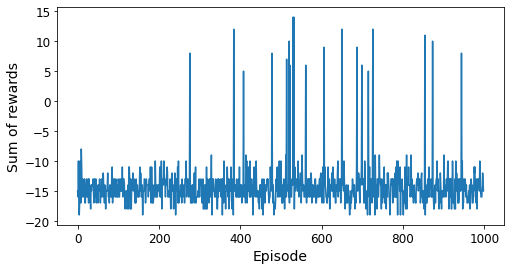

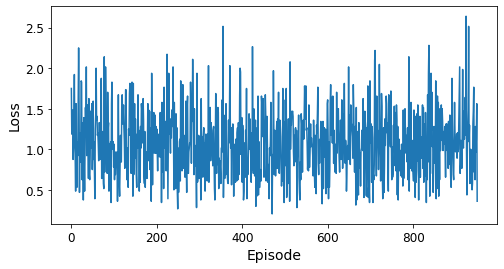

Episode: 2000, Last 100 Rewards: -14.07, Last 1000 Rewards: -14.31, Last 100 Losses: 0.938, Last 1000 Losses: 1.104            


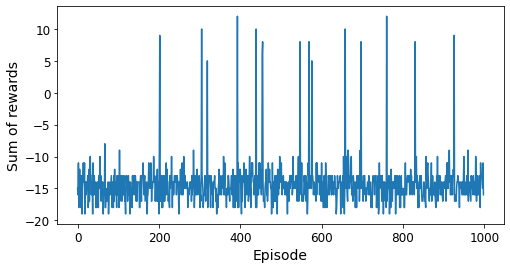

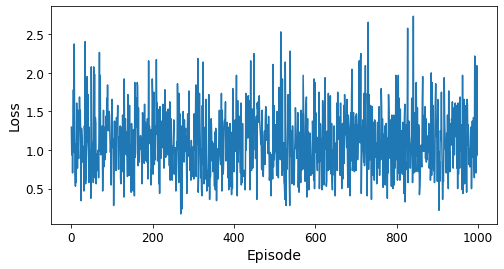

Episode: 2034, Reward: -14, Mean last 100 Rewards: -14.61, Loss: 0.750, Mean last 100 Losses: 1.120, eps: 0.00                               

KeyboardInterrupt: ignored

In [177]:
for episode in range(10000):
    obs = env.reset()  
    rew_per_ep=0
    for step in range(200):
        epsilon = 0 # max(1 - episode / 500, 0.01)
        obs, guessed, reward, done, info = play_one_step(env, obs, env.guessed, epsilon)
        rew_per_ep+=reward
        if done:
            break
    rewards.append(rew_per_ep)
#    if step >= best_score:
#        best_weights = model.get_weights()
#        best_score = step
    loss=0
    if episode >= 50:
        loss=training_step(batch_size)
        losses.append(loss)
        if episode % 50 == 0:
            target.set_weights(full_model.get_weights())
            
    print('\rEpisode: {}, Reward: {}, Loss: {:.5f}, eps: {:.3f}'\
    '            '.format(episode, rew_per_ep, loss, epsilon), end="") 
    # Alternatively, you can do soft updates at each step:
    # if episode >= 50:
        # target_weights = target.get_weights()
        # online_weights = model.get_weights()
        # for index in range(len(target_weights)):
        #     target_weights[index] = 0.99 * target_weights[index] + 0.01 * online_weights[index]
        # target.set_weights(target_weights)

    print('\r','\rEpisode: {}, Reward: {}, Mean last 100 Rewards: {:.2f}, Loss: {:.3f}, Mean last 100 Losses: {:.3f}, eps: {:.2f}'\
    '            '.format(episode, rew_per_ep, np.mean(rewards[-100:]), loss, np.mean(losses[-100:]), epsilon),\
                  end="                   ") 
    
    if episode>0 and episode%1000==0:
      
      print('\r','\rEpisode: {}, Last 100 Rewards: {:.2f}, Last 1000 Rewards: {:.2f}, Last 100 Losses: {:.3f}, Last 1000 Losses: {:.3f}'\
    '            '.format(episode, np.mean(rewards[-100:]), np.mean(rewards[-1000:]), loss, np.mean(losses[-100:]), np.mean(losses[-1000:])),\
                  end="") 
      print()

      plt.figure(figsize=(8, 4))
      plt.plot(rewards[-999:])
      plt.xlabel("Episode", fontsize=14)
      plt.ylabel("Sum of rewards", fontsize=14)
      plt.show()

      plt.figure(figsize=(8, 4))
      plt.plot(losses[-999:])
      plt.xlabel("Episode", fontsize=14)
      plt.ylabel("Loss", fontsize=14)
      plt.show()

# model.set_weights(best_weights)

## Test:

In [178]:
wins,losses,games=0,0,0
env = Hangman('test_words.txt'\
              , max_lives = 10, verbose = False)

remguess,totwin,words=[],[],[]
overall_rwd,tot_trials=0,100

for i in range(tot_trials):
    done = False
    obs = env.reset()
    j=0
    tot_rwd=0
    while not done and j<40:
        j+=1
        inp1=np.array([state_to_input(obs)])
        inp2=np.array([guess_to_input(env.guessed)])
        action_proba = full_model([inp1,inp2])
        sorted_proba=np.argsort(-np.array(action_proba))[0]
        for it in sorted_proba:
            if alphabet[it] not in env.guessed:
                action_guess=alphabet[it]
                break 
        obs, rwd , done , wrd = env.step(action_guess)
        tot_rwd+=rwd

    if rwd==10: wins+=1
    if rwd==-10: losses+=1
    games+=1
    print('\r   Games: {}, Wins: {}, Losses: {}, Win percentage: {:.3f}\
        '.format(games,wins,losses,wins/games), end="")

   Games: 100, Wins: 2, Losses: 98, Win percentage: 0.020        

# Dueling Double DQN

In [179]:
from collections import deque

n_outputs=26
alphabet=[chr(i+97) for i in range(0,26)]

## Define NNs:

In [180]:
keras.backend.clear_session()
#np.random.seed(42)
#tf.random.set_seed(42)

In [183]:
# guessed_input

guessed_inputs = keras.Input(shape=(26,))
guessed_feature = keras.layers.Dense(60, activation='elu',name='guess1_1')(guessed_inputs)
guessed_feature = keras.layers.Dense(60, activation='tanh',name='guess3_1')(guessed_feature)

guessed_model = keras.Model(guessed_inputs, guessed_feature, name='guessed_1')

# state_input

max_length=max_len

state_inputs = keras.Input(shape=(max_length,))
state_feature = keras.layers.Embedding(max_length,128, mask_zero = True)(state_inputs)
state_feature = keras.layers.Bidirectional(keras.layers.LSTM(128 , return_sequences=True))(state_feature)
state_feature = keras.layers.Bidirectional(keras.layers.LSTM(128 , return_sequences=True))(state_feature)
state_feature = keras.layers.GlobalAveragePooling1D()(state_feature)
state_feature = keras.layers.Dense(100, activation = 'tanh', name='final1_1')(state_feature)

state_model = keras.Model(state_inputs,state_feature , name = 'state_1')

# Final Layers

inputs = keras.layers.Concatenate()([state_model.output, guessed_model.output])
feature = keras.layers.Dense(100, activation = 'elu')(inputs)
hidden3 = keras.layers.Dense(26, activation = 'softmax', name='hidden3_1')(feature)

#full_model = keras.Model([state_model.input, guessed_model.input], feature, name = 'fullmodel')

In [184]:
keras.backend.clear_session()

K = keras.backend

#input_states = keras.layers.Input(shape=[4])
#hidden1 = keras.layers.Dense(32, activation="elu")(input_states)
#hidden2 = keras.layers.Dense(32, activation="elu")(hidden1)

state_values = keras.layers.Dense(1)(hidden3)
raw_advantages = keras.layers.Dense(n_outputs)(hidden3)

advantages = raw_advantages - K.max(raw_advantages, axis=1, keepdims=True)
Q_values = state_values + advantages

#model = keras.models.Model(inputs=[input_states], outputs=[Q_values])
full_model = keras.Model([state_model.input, guessed_model.input], outputs=[Q_values], name = 'fullmodel1')

target = keras.models.clone_model(full_model)
target.set_weights(full_model.get_weights())

In [185]:
full_model.summary()

Model: "fullmodel1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 31)]         0           []                               
                                                                                                  
 embedding (Embedding)          (None, 31, 128)      3968        ['input_2[0][0]']                
                                                                                                  
 bidirectional (Bidirectional)  (None, 31, 256)      263168      ['embedding[0][0]']              
                                                                                                  
 bidirectional_1 (Bidirectional  (None, 31, 256)     394240      ['bidirectional[0][0]']          
 )                                                                                       

## Setup Training:

In [195]:
env = Hangman('words_250000_train.txt' , max_lives = 6, verbose = False)

In [196]:
def epsilon_greedy_policy(obs,guessed_letters, epsilon=0):
    if np.random.rand() < epsilon:
        return alphabet[np.random.randint(n_outputs)]
    else:
        inp1=np.array([state_to_input(obs)])
        inp2=np.array([guess_to_input(guessed_letters)])
        Q_values = full_model.predict([inp1,inp2],verbose = 0)
        sorted_Q_values=np.argsort(-np.array(Q_values))[0]
        for it in sorted_Q_values:
            if alphabet[it] not in guessed_letters:
                Q_values_guess=alphabet[it]
                break
        return Q_values_guess

In [197]:
replay_memory = deque(maxlen=1000)

In [198]:
def sample_experiences(batch_size):
    indices = np.random.randint(len(replay_memory), size=batch_size)
    batch = [replay_memory[index] for index in indices]
    states, guessed_lett, actions, rewards, next_states, next_guessed, dones = [
        np.array([experience[field_index] for experience in batch])
        for field_index in range(7)]
    return states, guessed_lett, actions, rewards, next_states, next_guessed, dones

In [199]:
def play_one_step(env, obs, guessed_letters, epsilon):
    gl = guessed_letters[:]
    action = epsilon_greedy_policy(obs, guessed_letters, epsilon)
    next_state, reward, done, info = env.step(action)
    next_guessed = env.guessed
    replay_memory.append((obs, gl, action, reward, next_guessed, next_state, done))
    return next_state, next_guessed, reward, done, info

In [200]:
optimizer = keras.optimizers.Adam(learning_rate=1e-3)
loss_fn = keras.losses.mean_squared_error

full_model.compile(loss = 'categorical_crossentropy', optimizer = optimizer)

In [201]:
batch_size = 50
discount_rate = 1 #0.95

def training_step(batch_size):
    experiences = sample_experiences(batch_size)
    states, guessed_lett, actions, rewards, next_states, next_guessed, dones = experiences
    
    next_inp1=np.array([state_to_input(next_state) for next_state in next_states])
    next_inp2=np.array([guess_to_input(next_guess) for next_guess in next_guessed])
    next_Q_values = full_model.predict([next_inp1, next_inp2],verbose = 0)
    
    best_next_actions = np.argmax(next_Q_values, axis=1)
    
    next_mask = tf.one_hot(best_next_actions, n_outputs).numpy()
    next_best_Q_values = (target.predict([next_inp1,next_inp2],verbose = 0) * next_mask).sum(axis=1)
    
#    max_next_Q_values = np.max(next_Q_values, axis=1)
    target_Q_values = (rewards +
                       (1 - dones) * discount_rate * next_best_Q_values)
    target_Q_values = target_Q_values.reshape(-1, 1)

    actions_inp = np.array([ord(action)-97 for action in actions])
    mask = tf.one_hot(actions_inp, n_outputs)
    
    with tf.GradientTape() as tape:
        all_Q_values = full_model([next_inp1,next_inp2])
        Q_values = tf.reduce_sum(all_Q_values * mask, axis=1, keepdims=True)
        loss = tf.reduce_mean(loss_fn(target_Q_values, Q_values))
    grads = tape.gradient(loss, full_model.trainable_variables)
    optimizer.apply_gradients(zip(grads, full_model.trainable_variables))
    return loss

In [202]:
rewards,losses,best_score = [],[],0

Episode: 49, Reward: -12, Mean last 100 Rewards: -12.98, Loss: 0.000, Mean last 100 Losses: nan, eps: 0.00                               

<ipython-input-198-c9036c019d7f>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([experience[field_index] for experience in batch])


Episode: 1000, Last 100 Rewards: -7.35, Last 1000 Rewards: -9.82, Last 100 Losses: 5.045, Last 1000 Losses: 7.402            


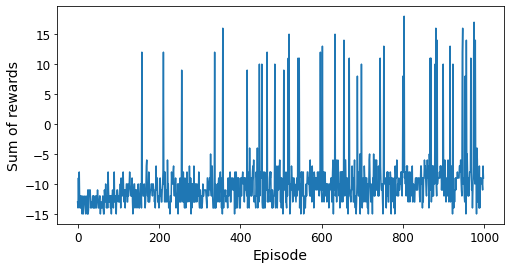

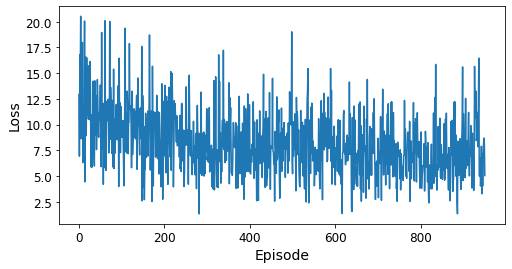

Episode: 1499, Reward: -15, Mean last 100 Rewards: -7.91, Loss: 7.943, Mean last 100 Losses: 7.694, eps: 0.00                               

In [203]:
for episode in range(1500):
    obs = env.reset()  
    rew_per_ep = 0
    for step in range(200):
        epsilon = 0 #max(1 - episode / 500, 0.01)
        obs, guessed, reward, done, info = play_one_step(env, obs, env.guessed, epsilon)
        rew_per_ep += reward
        if done:
            break

    rewards.append(rew_per_ep)
#    if step >= best_score:
#        best_weights = model.get_weights()
#        best_score = step
    loss=0
    if episode >= 50:
        loss = training_step(batch_size)
        losses.append(loss)
        if episode % 50 == 0:
            target.set_weights(full_model.get_weights())
            
    print('\rEpisode: {}, Reward: {}, Loss: {:.5f}, eps: {:.3f}'\
    '            '.format(episode, rew_per_ep, loss, epsilon), end="") 
    # Alternatively, you can do soft updates at each step:
    #if episode >= 50:
        #target_weights = target.get_weights()
        #online_weights = model.get_weights()
        #for index in range(len(target_weights)):
        #    target_weights[index] = 0.99 * target_weights[index] + 0.01 * online_weights[index]
        #target.set_weights(target_weights)

    print('\r','\rEpisode: {}, Reward: {}, Mean last 100 Rewards: {:.2f}, Loss: {:.3f}, Mean last 100 Losses: {:.3f}, eps: {:.2f}'\
    '            '.format(episode, rew_per_ep, np.mean(rewards[-100:]), loss, np.mean(losses[-100:]), epsilon),\
                  end="                   ") 
    
    if episode>0 and episode%1000==0:
      
      print('\r','\rEpisode: {}, Last 100 Rewards: {:.2f}, Last 1000 Rewards: {:.2f}, Last 100 Losses: {:.3f}, Last 1000 Losses: {:.3f}'\
    '            '.format(episode, np.mean(rewards[-100:]), np.mean(rewards[-1000:]), loss, np.mean(losses[-100:]), np.mean(losses[-1000:])),\
                  end="") 
      print()

      plt.figure(figsize=(8, 4))
      plt.plot(rewards[-999:])
      plt.xlabel("Episode", fontsize=14)
      plt.ylabel("Sum of rewards", fontsize=14)
      plt.show()

      plt.figure(figsize=(8, 4))
      plt.plot(losses[-999:])
      plt.xlabel("Episode", fontsize=14)
      plt.ylabel("Loss", fontsize=14)
      plt.show()

#model.set_weights(best_weights)

## 2. More training:

Episode: 49, Reward: -10, Mean last 100 Rewards: -8.16, Loss: 0.000, Mean last 100 Losses: 7.694, eps: 0.00                               

<ipython-input-198-c9036c019d7f>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([experience[field_index] for experience in batch])


Episode: 1000, Last 100 Rewards: -6.38, Last 1000 Rewards: -7.66, Last 100 Losses: 4.638, Last 1000 Losses: 7.696            


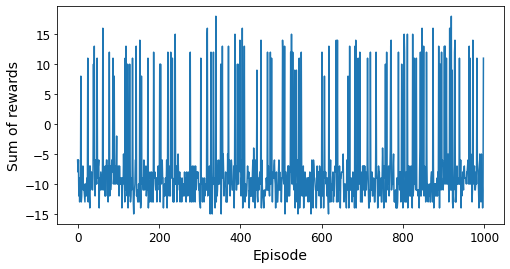

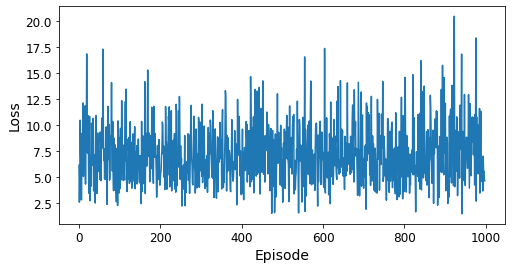

Smoothed rewards:


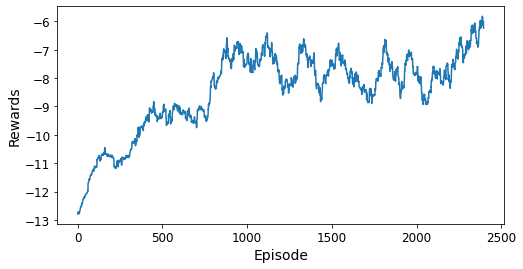

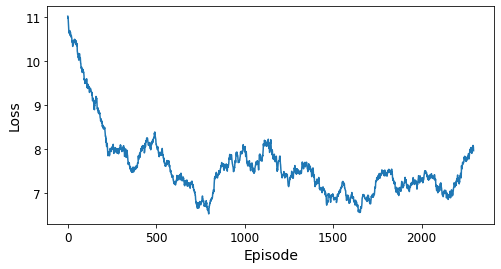

Episode: 2000, Last 100 Rewards: -7.76, Last 1000 Rewards: -7.57, Last 100 Losses: 5.948, Last 1000 Losses: 7.276            


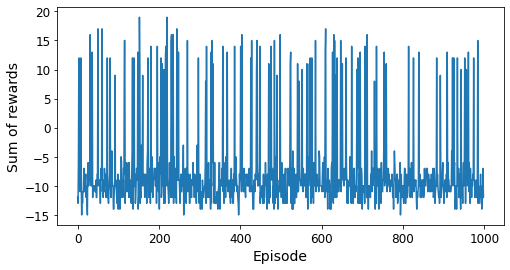

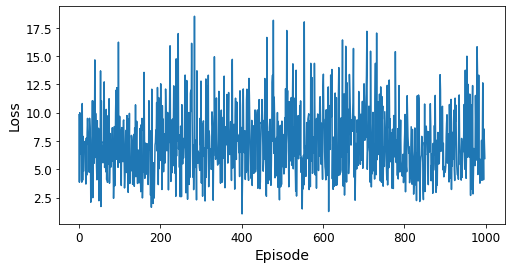

Smoothed rewards:


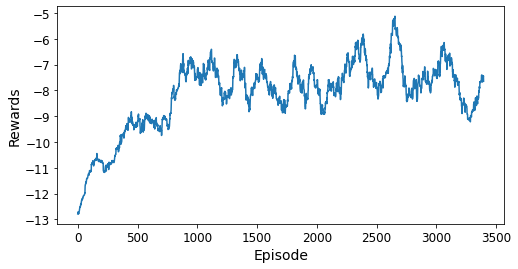

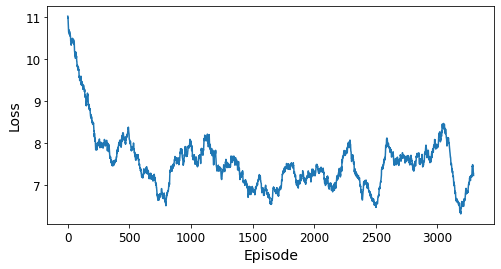

Episode: 3000, Last 100 Rewards: -6.91, Last 1000 Rewards: -7.06, Last 100 Losses: 4.647, Last 1000 Losses: 7.611            


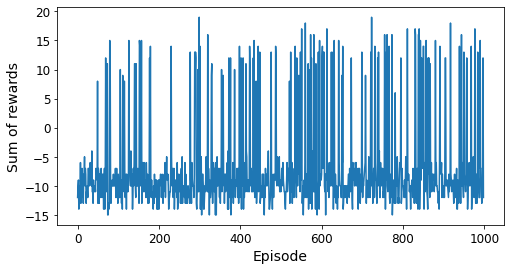

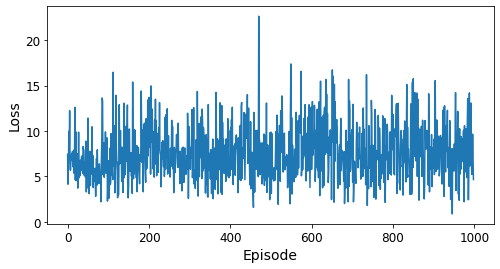

Smoothed rewards:


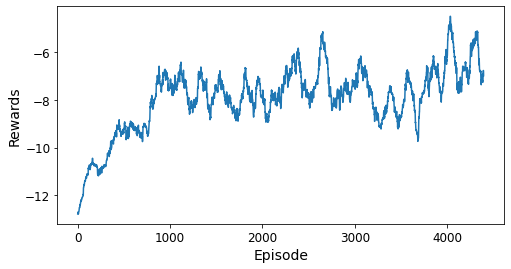

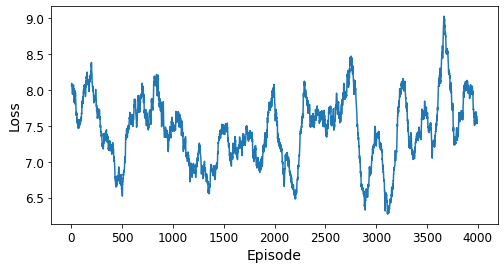

Episode: 4000, Last 100 Rewards: -6.26, Last 1000 Rewards: -6.97, Last 100 Losses: 6.699, Last 1000 Losses: 8.148            


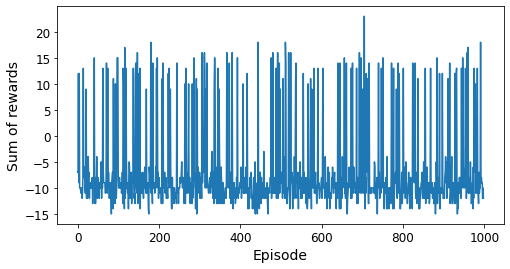

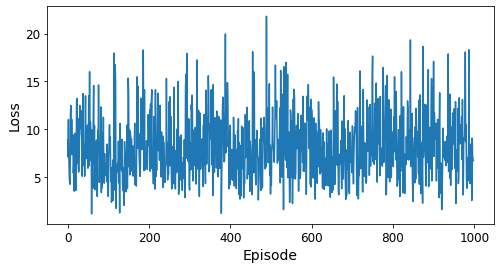

Smoothed rewards:


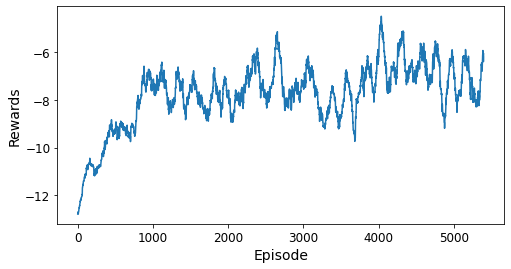

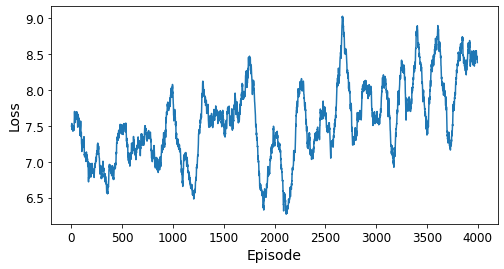

Episode: 5000, Last 100 Rewards: -7.01, Last 1000 Rewards: -7.01, Last 100 Losses: 4.231, Last 1000 Losses: 8.555            


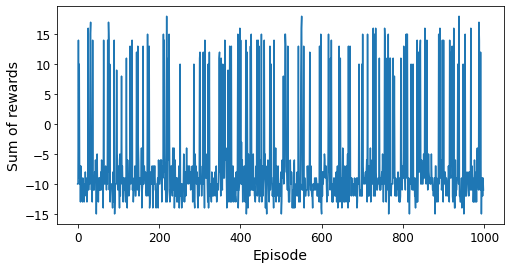

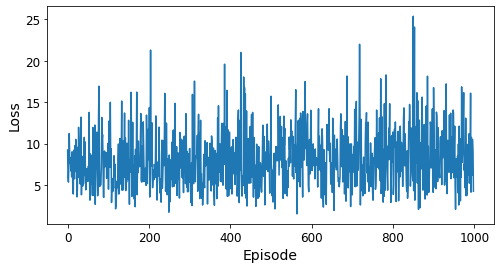

Smoothed rewards:


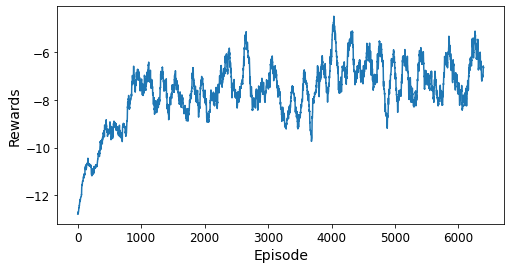

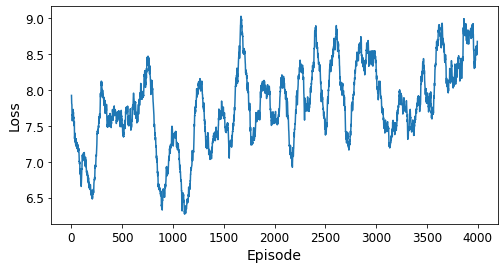

Episode: 6000, Last 100 Rewards: -7.04, Last 1000 Rewards: -6.97, Last 100 Losses: 8.714, Last 1000 Losses: 8.700            


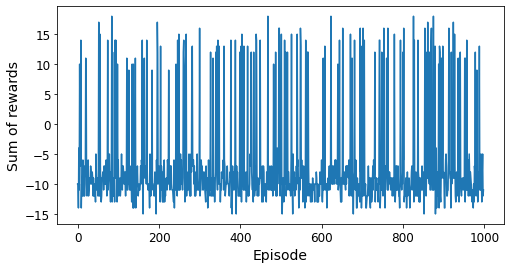

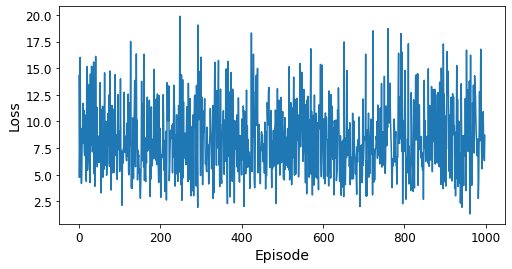

Smoothed rewards:


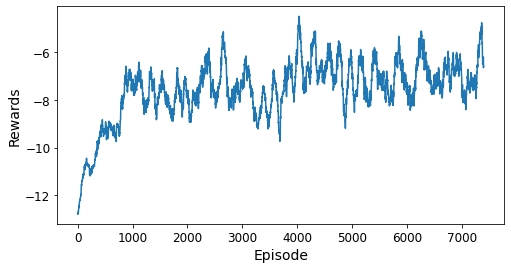

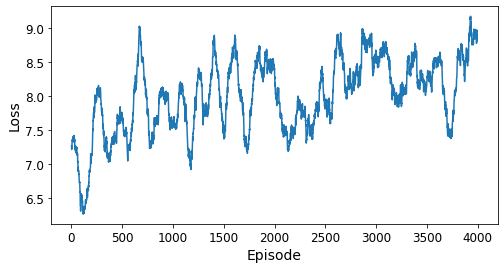

Episode: 7000, Last 100 Rewards: -6.80, Last 1000 Rewards: -6.72, Last 100 Losses: 9.769, Last 1000 Losses: 9.172            


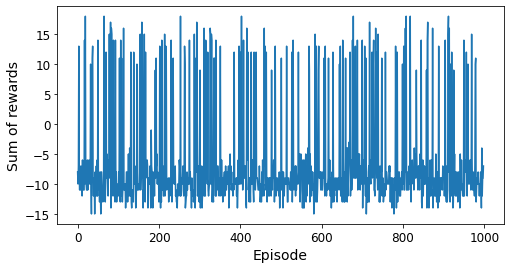

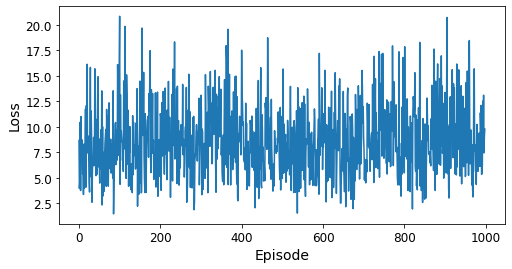

Smoothed rewards:


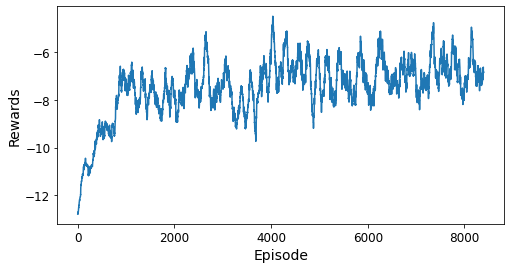

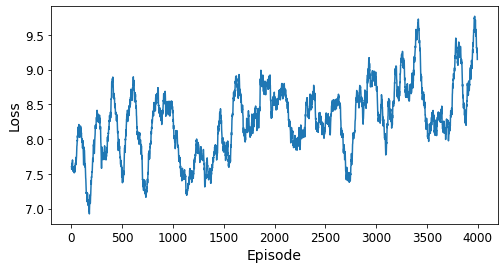

Episode: 8000, Last 100 Rewards: -6.42, Last 1000 Rewards: -6.78, Last 100 Losses: 5.610, Last 1000 Losses: 8.520            


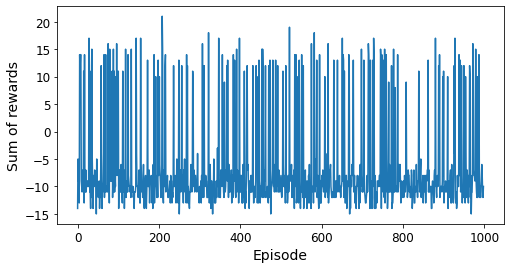

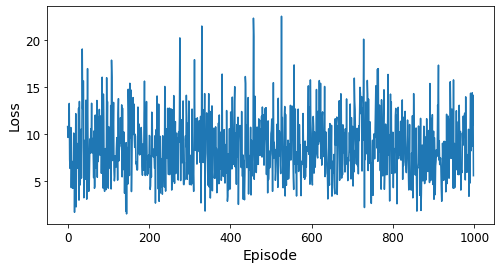

Smoothed rewards:


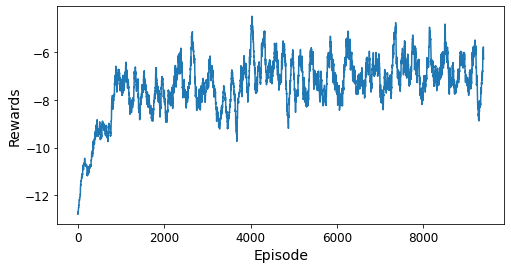

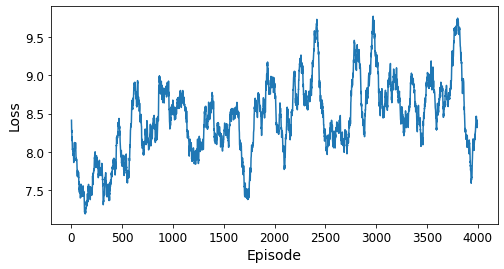

Episode: 9000, Last 100 Rewards: -6.07, Last 1000 Rewards: -7.01, Last 100 Losses: 11.907, Last 1000 Losses: 9.274            


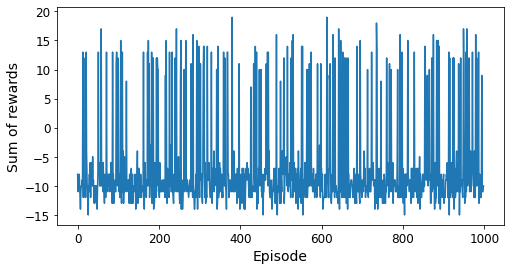

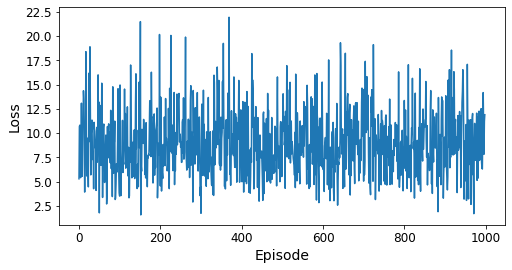

Smoothed rewards:


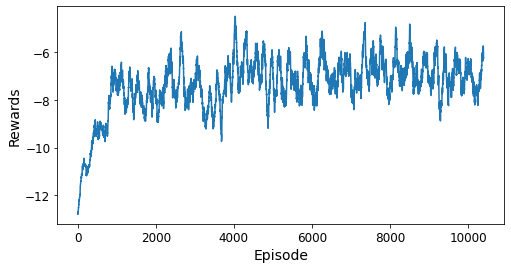

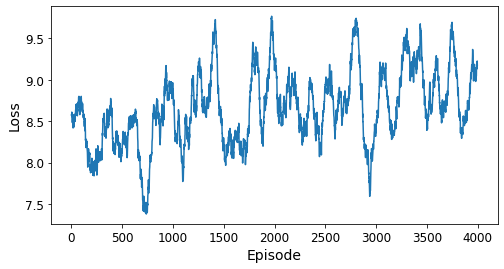

Episode: 10000, Last 100 Rewards: -6.94, Last 1000 Rewards: -7.18, Last 100 Losses: 4.065, Last 1000 Losses: 9.315            


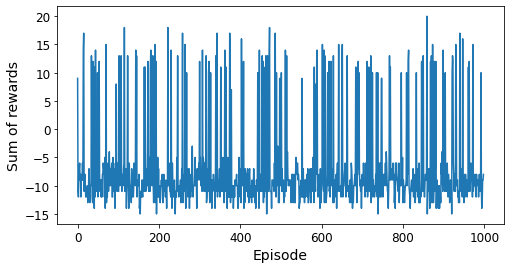

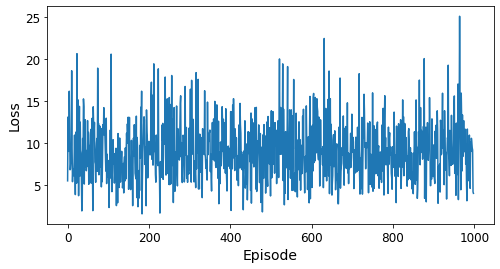

Smoothed rewards:


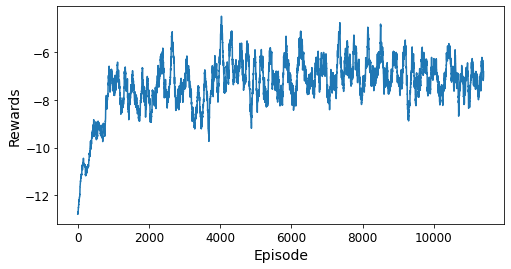

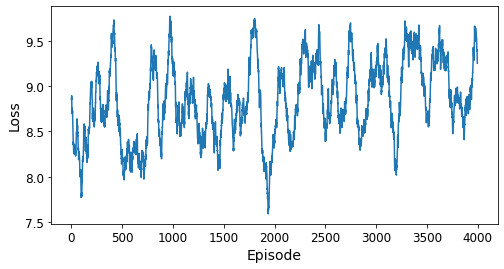

Episode: 11000, Last 100 Rewards: -6.94, Last 1000 Rewards: -7.09, Last 100 Losses: 6.467, Last 1000 Losses: 9.282            


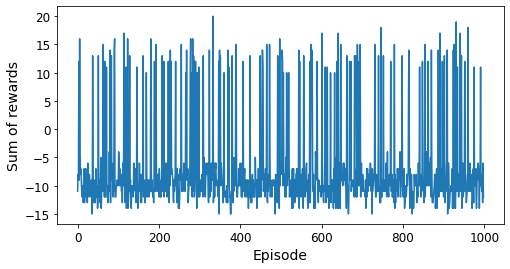

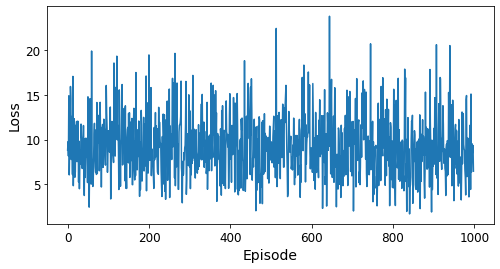

Smoothed rewards:


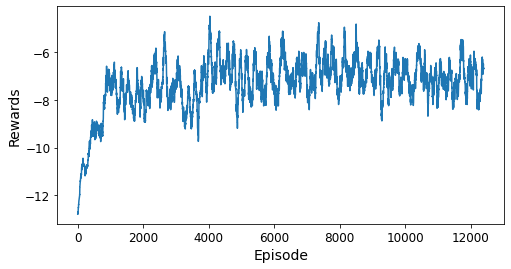

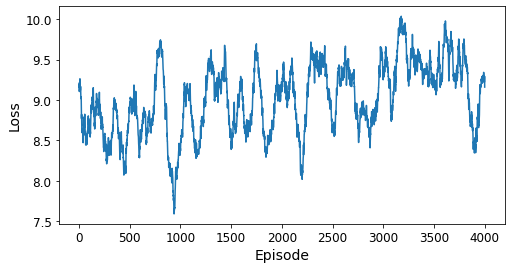

Episode: 12000, Last 100 Rewards: -6.82, Last 1000 Rewards: -7.07, Last 100 Losses: 10.800, Last 1000 Losses: 10.002            


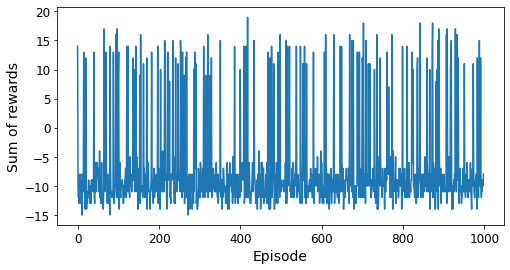

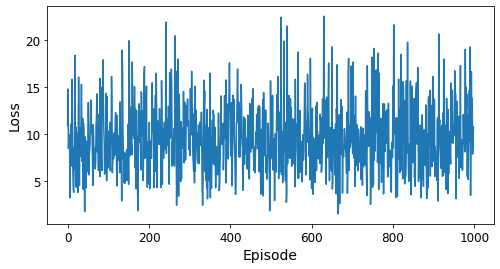

Smoothed rewards:


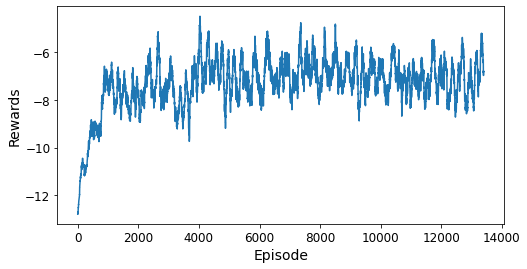

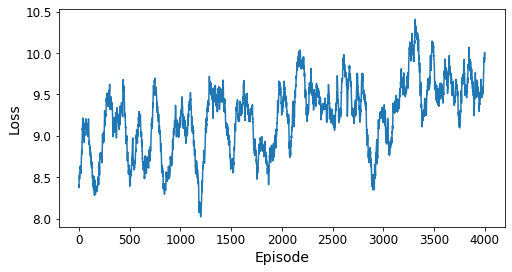

Episode: 13000, Last 100 Rewards: -7.29, Last 1000 Rewards: -7.26, Last 100 Losses: 7.719, Last 1000 Losses: 9.579            


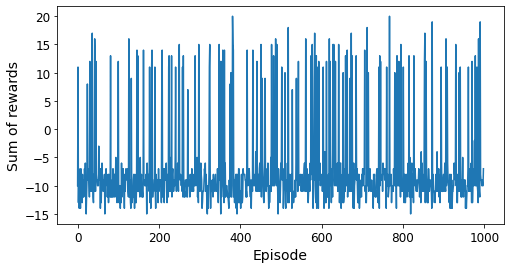

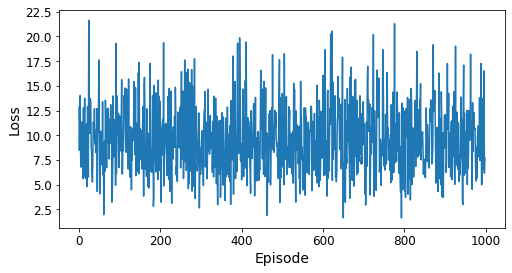

Smoothed rewards:


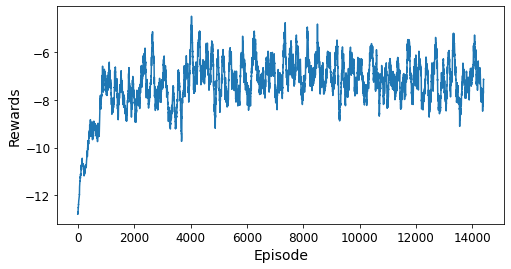

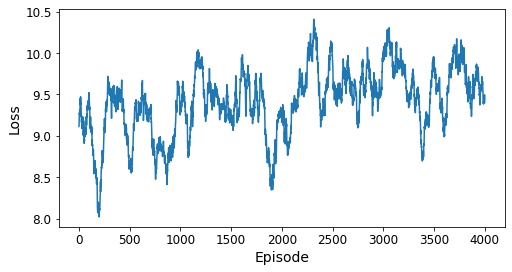

Episode: 14000, Last 100 Rewards: -5.78, Last 1000 Rewards: -6.57, Last 100 Losses: 8.088, Last 1000 Losses: 9.650            


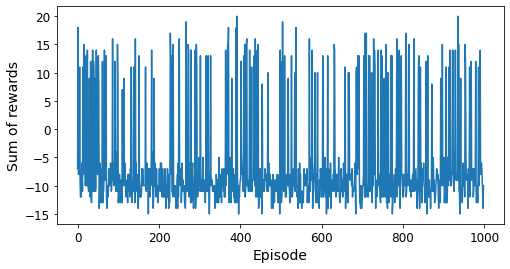

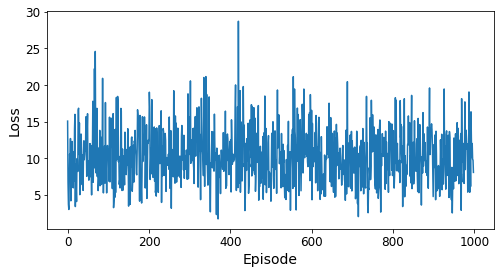

Smoothed rewards:


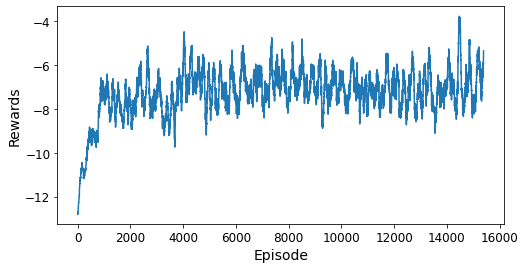

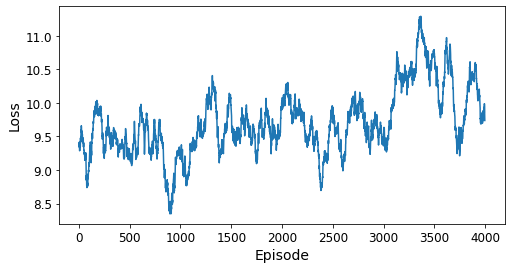

Episode: 15000, Last 100 Rewards: -5.89, Last 1000 Rewards: -6.95, Last 100 Losses: 9.739, Last 1000 Losses: 11.234            


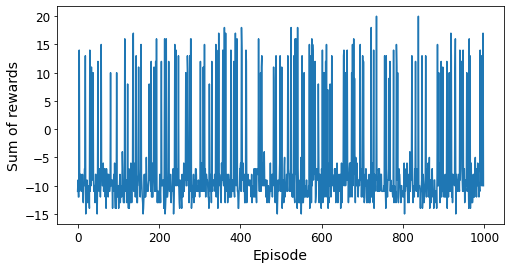

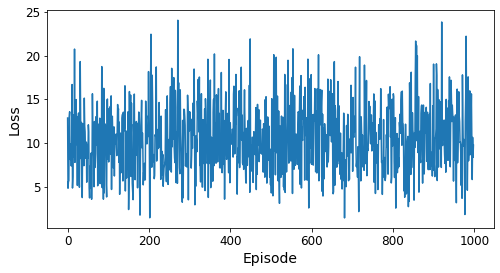

Smoothed rewards:


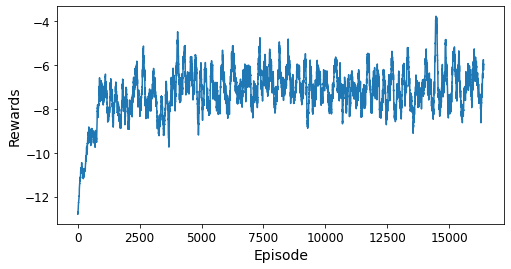

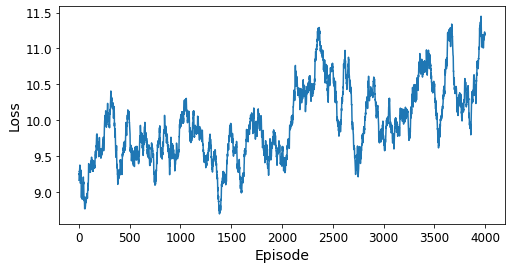

Episode: 16000, Last 100 Rewards: -5.71, Last 1000 Rewards: -6.44, Last 100 Losses: 10.992, Last 1000 Losses: 10.825            


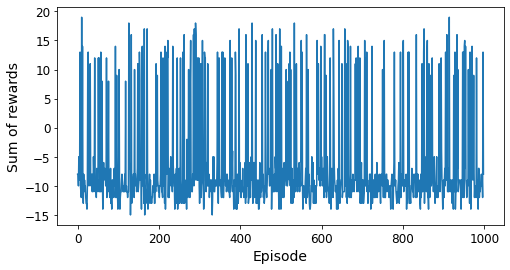

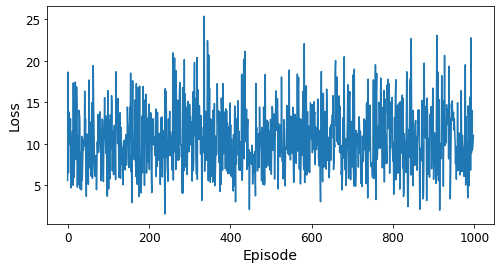

Smoothed rewards:


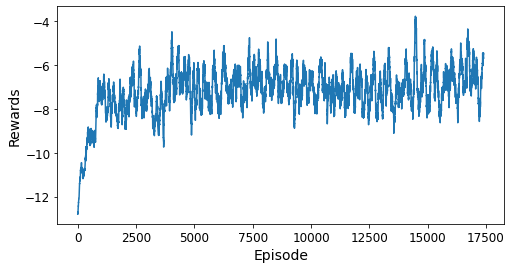

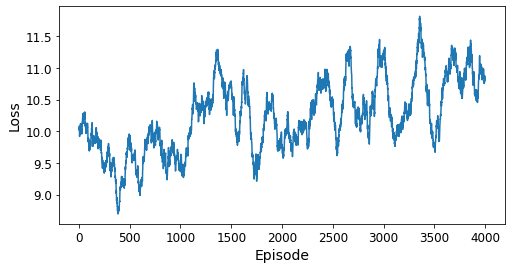

Episode: 17000, Last 100 Rewards: -7.13, Last 1000 Rewards: -6.58, Last 100 Losses: 2.805, Last 1000 Losses: 11.796            


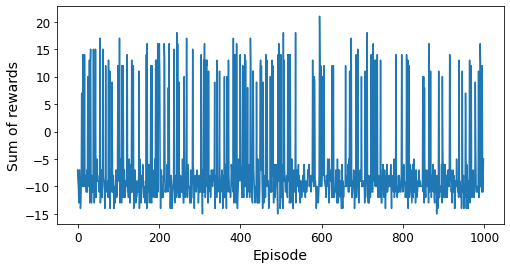

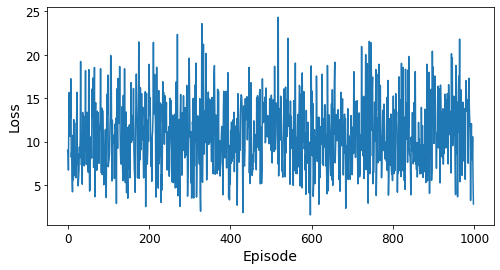

Smoothed rewards:


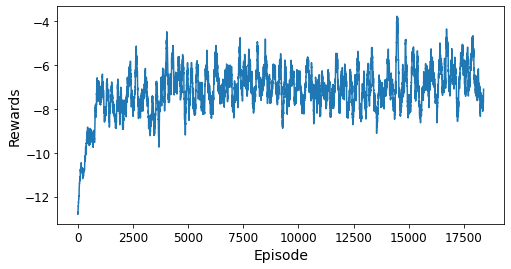

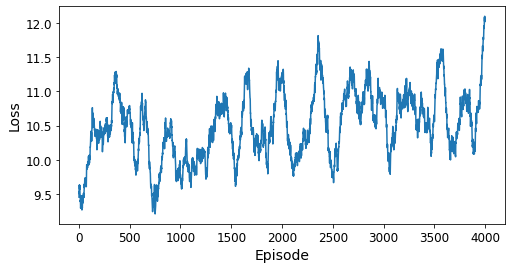

Episode: 18000, Last 100 Rewards: -6.47, Last 1000 Rewards: -6.96, Last 100 Losses: 13.745, Last 1000 Losses: 11.539            


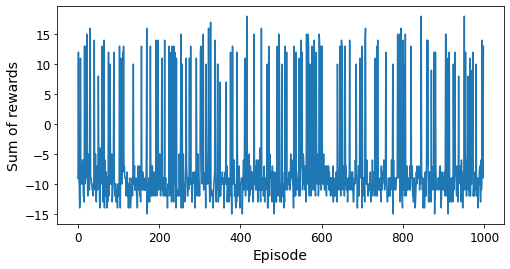

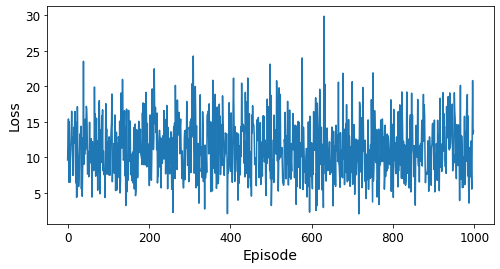

Smoothed rewards:


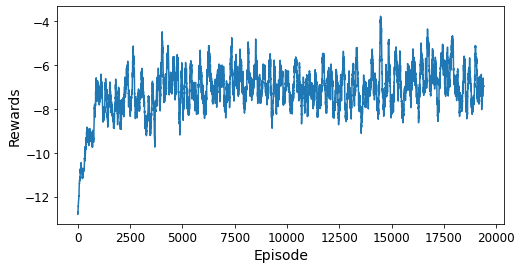

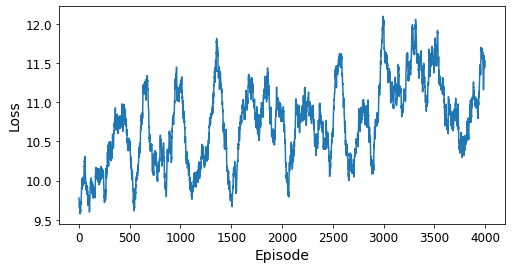

Episode: 19000, Last 100 Rewards: -7.92, Last 1000 Rewards: -7.17, Last 100 Losses: 4.856, Last 1000 Losses: 11.169            


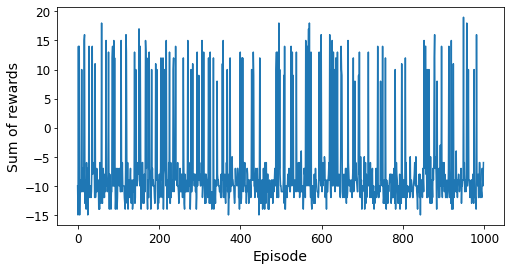

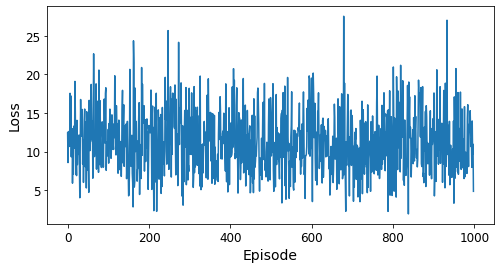

Smoothed rewards:


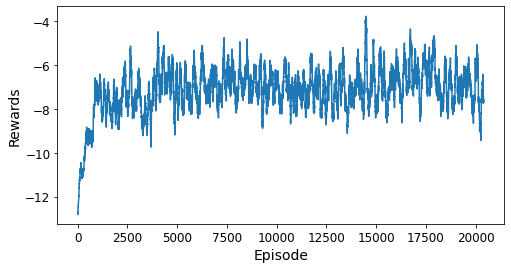

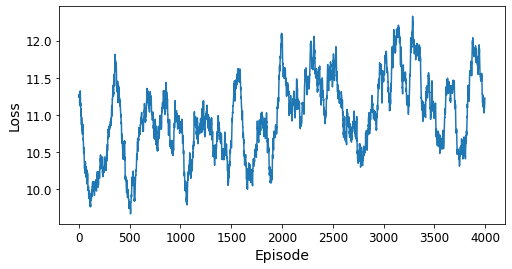

Episode: 19999, Reward: -11, Mean last 100 Rewards: -5.89, Loss: 10.069, Mean last 100 Losses: 11.468, eps: 0.00                               

In [204]:
for episode in range(20000):
    
    obs = env.reset()  
    rew_per_ep=0

    for step in range(200):
        epsilon = 0 #max(1 - episode / 500, 0.01)
        obs, guessed, reward, done, info = play_one_step(env, obs, env.guessed, epsilon)
        rew_per_ep+=reward
        if done:
            break
    
    rewards.append(rew_per_ep)

    loss=0
    if episode >= 50:
        loss=training_step(batch_size)
        losses.append(loss)
        if episode % 200 == 0:
            target.set_weights(full_model.get_weights())
            
    print('\r','\rEpisode: {}, Reward: {}, Mean last 100 Rewards: {:.2f}, Loss: {:.3f}, Mean last 100 Losses: {:.3f}, eps: {:.2f}'\
    '            '.format(episode, rew_per_ep, np.mean(rewards[-100:]), loss, np.mean(losses[-100:]), epsilon),\
                  end="                   ") 
    
    if episode>0 and episode%1000==0:
      
      print('\r','\rEpisode: {}, Last 100 Rewards: {:.2f}, Last 1000 Rewards: {:.2f}, Last 100 Losses: {:.3f}, Last 1000 Losses: {:.3f}'\
    '            '.format(episode, np.mean(rewards[-100:]), np.mean(rewards[-1000:]), loss, np.mean(losses[-100:]), np.mean(losses[-1000:])),\
                  end="") 
      print()

      plt.figure(figsize=(8, 4))
      plt.plot(rewards[-999:])
      plt.xlabel("Episode", fontsize=14)
      plt.ylabel("Sum of rewards", fontsize=14)
      plt.show()

      plt.figure(figsize=(8, 4))
      plt.plot(losses[-999:])
      plt.xlabel("Episode", fontsize=14)
      plt.ylabel("Loss", fontsize=14)
      plt.show()

      #full_model.save('./drive/MyDrive/RI_DDDQL_large.h5', include_optimizer=True)

      print('Smoothed rewards:')
      
      rwd_smooth=[np.mean(rewards[i:i+100]) for i in range(len(rewards)-105)]
      losses_smooth=[np.mean(losses[i:i+100]) for i in range(len(losses)-105)]
      #
      plt.figure(figsize=(8, 4))
      plt.plot(rwd_smooth)
      plt.xlabel("Episode", fontsize=14)
      plt.ylabel("Rewards", fontsize=14)
      plt.show()
      #
      plt.figure(figsize=(8, 4))
      plt.plot(losses_smooth[-4000:-1])
      plt.xlabel("Episode", fontsize=14)
      plt.ylabel("Loss", fontsize=14)
      plt.show()


### Test:

In [216]:
ws,ls,gs=0,0,0
test_env = Hangman('test_words.txt'\
              , max_lives = 6, verbose = False)

tot_trials=100

for i in range(tot_trials):
    test_done = False
    test_obs = test_env.reset()
    j=0

    while not test_done:
        j+=1
        inp1=np.array([state_to_input(test_obs)])
        inp2=np.array([guess_to_input(test_env.guessed)])

        action_proba = full_model([inp1,inp2])
        sorted_proba=np.argsort(-np.array(action_proba))[0]
        for it in sorted_proba:
            if alphabet[it] not in test_env.guessed:
                action_guess=alphabet[it]
                break      
        
        test_obs, test_rwd , test_done , test_wrd = test_env.step(action_guess)

    if test_rwd==10: ws+=1
    if test_rwd==-10: ls+=1
    gs+=1
    print('\r   Games: {}, Wins: {}, Losses: {}, Win percentage: {:.3f}    '.format(gs,ws,ls,ws/games), end="")

   Games: 100, Wins: 14, Losses: 86, Win percentage: 0.140    

## More Training II:

Episode: 49, Reward: -11, Mean last 100 Rewards: -6.35, Loss: 0.000, Mean last 100 Losses: 11.230, eps: 0.00                               

<ipython-input-198-c9036c019d7f>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([experience[field_index] for experience in batch])


Episode: 1000, Last 100 Rewards: -7.13, Last 1000 Rewards: -7.12, Last 100 Losses: 20.022, Last 1000 Losses: 12.875            


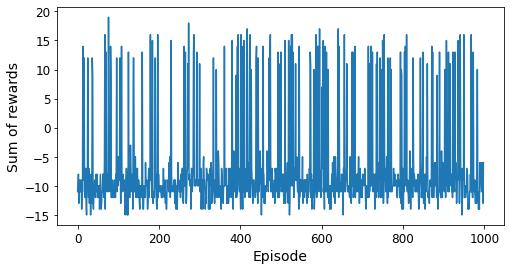

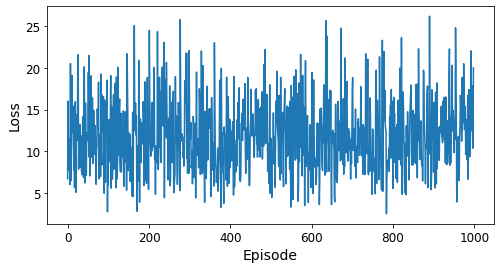

Smoothed rewards:


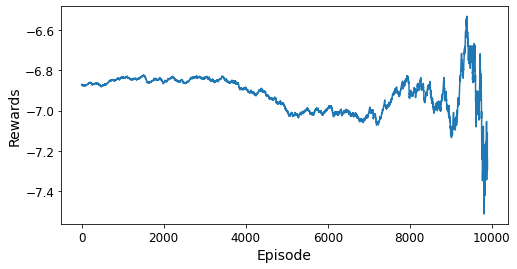

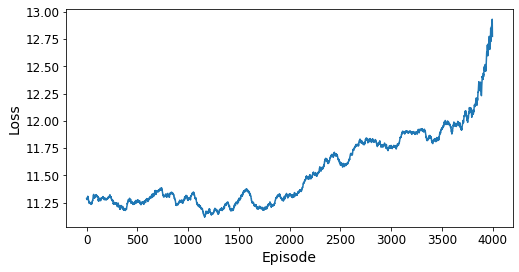

Episode: 2000, Last 100 Rewards: -6.60, Last 1000 Rewards: -6.98, Last 100 Losses: 17.609, Last 1000 Losses: 11.114            


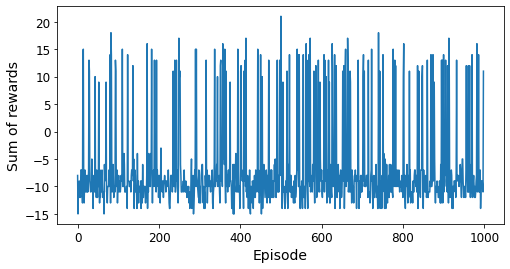

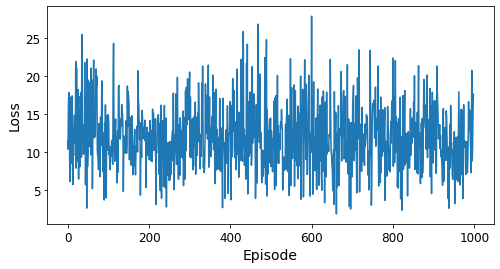

Smoothed rewards:


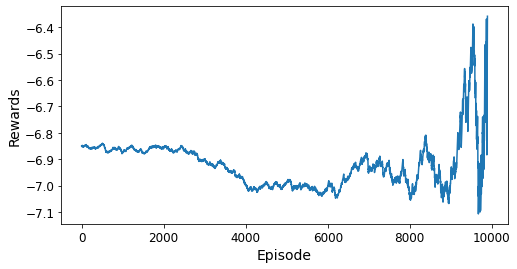

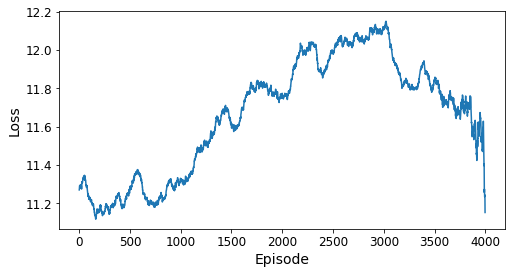

Episode: 3000, Last 100 Rewards: -5.76, Last 1000 Rewards: -6.76, Last 100 Losses: 10.751, Last 1000 Losses: 11.456            


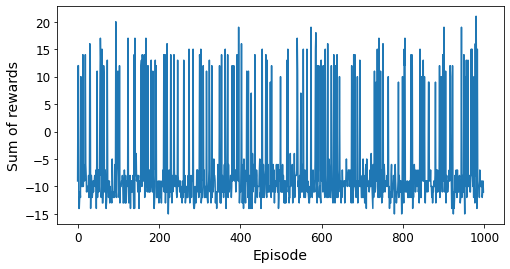

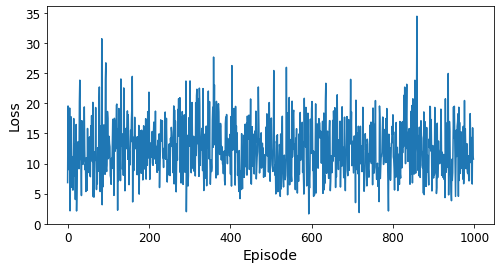

Smoothed rewards:


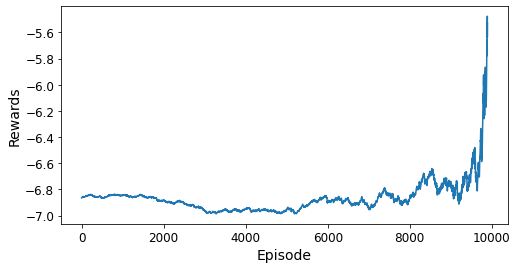

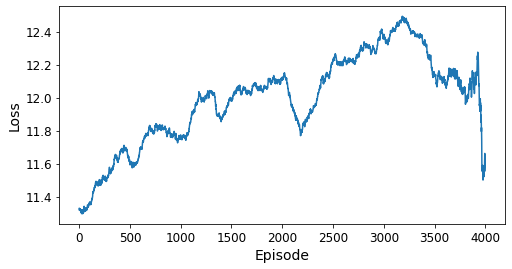

Episode: 4000, Last 100 Rewards: -7.93, Last 1000 Rewards: -7.11, Last 100 Losses: 13.428, Last 1000 Losses: 11.898            


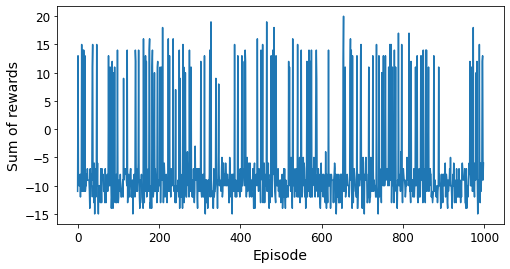

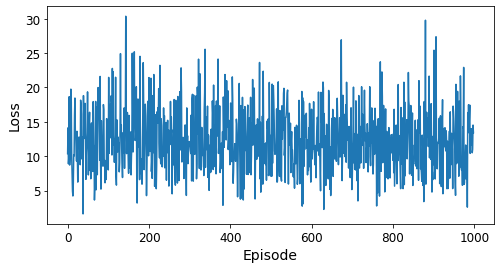

Smoothed rewards:


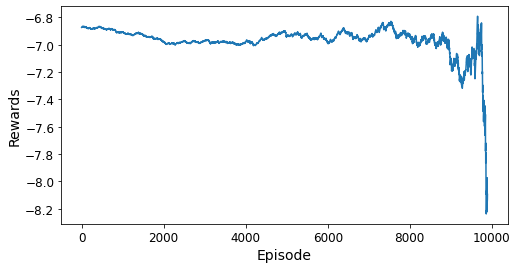

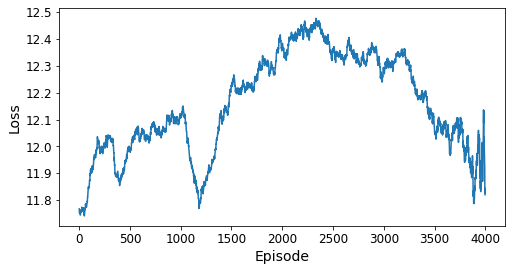

Episode: 5000, Last 100 Rewards: -8.83, Last 1000 Rewards: -6.92, Last 100 Losses: 13.255, Last 1000 Losses: 14.482            


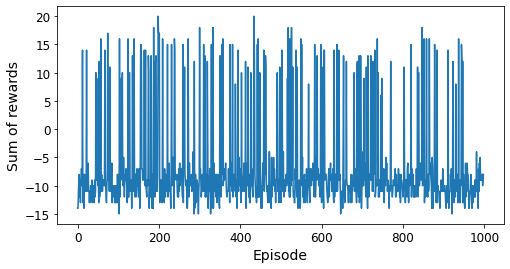

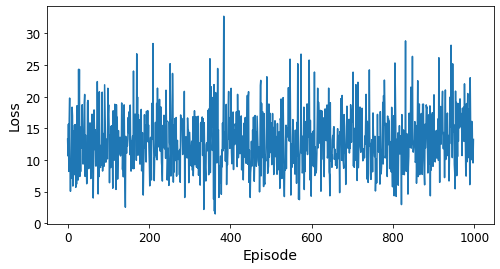

Smoothed rewards:


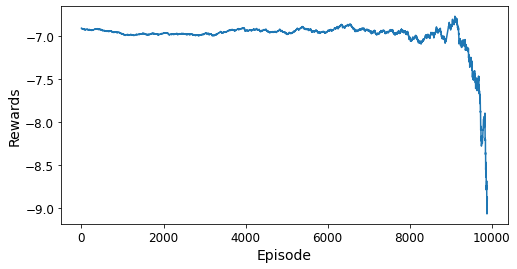

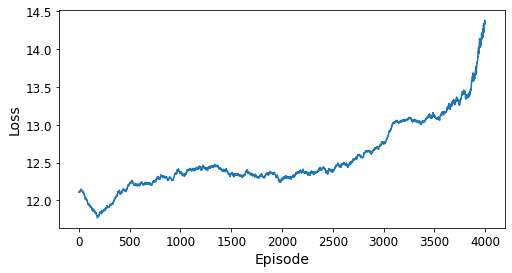

Episode: 6000, Last 100 Rewards: -6.16, Last 1000 Rewards: -6.82, Last 100 Losses: 11.872, Last 1000 Losses: 12.438            


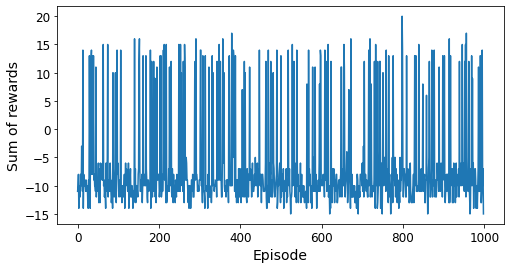

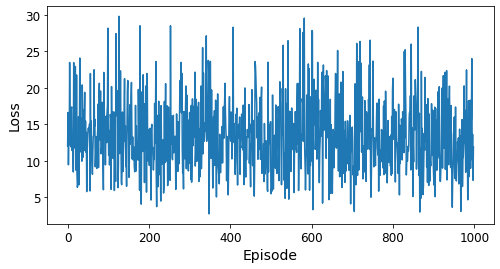

Smoothed rewards:


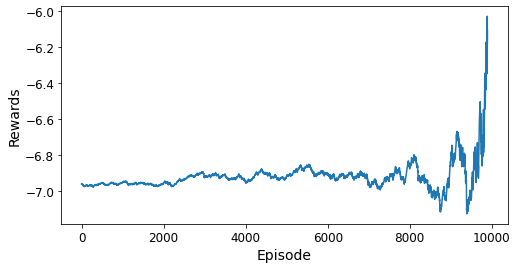

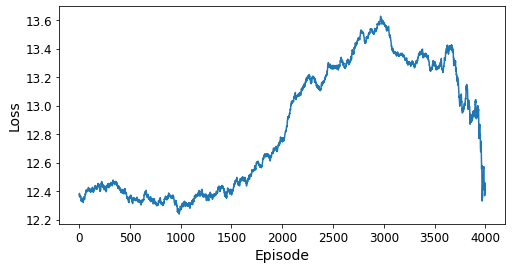

Episode: 7000, Last 100 Rewards: -7.03, Last 1000 Rewards: -7.02, Last 100 Losses: 13.567, Last 1000 Losses: 13.122            


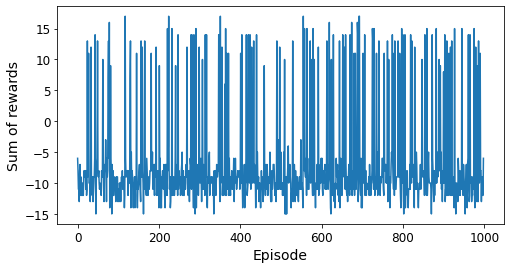

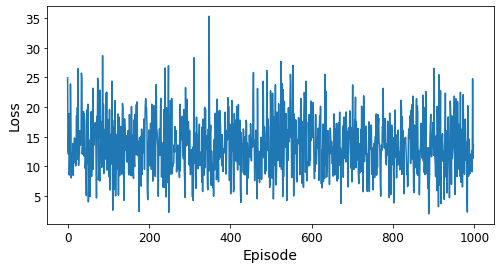

Smoothed rewards:


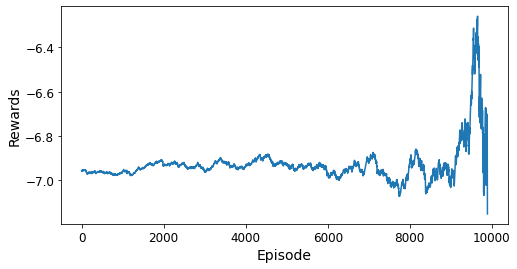

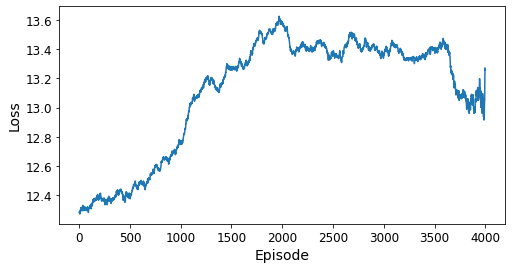

Episode: 8000, Last 100 Rewards: -8.21, Last 1000 Rewards: -7.00, Last 100 Losses: 23.822, Last 1000 Losses: 14.633            


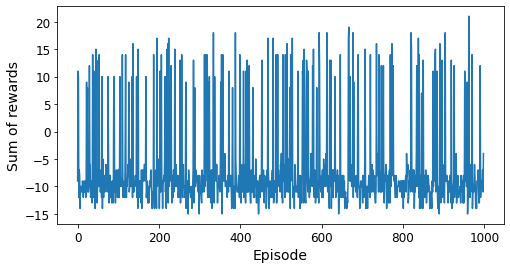

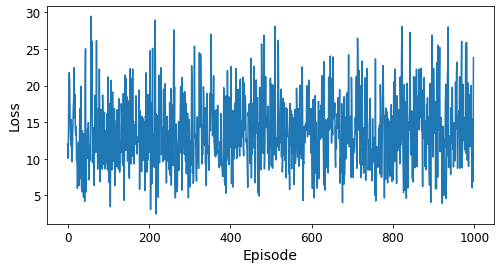

Smoothed rewards:


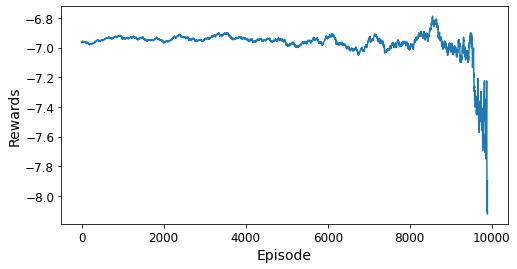

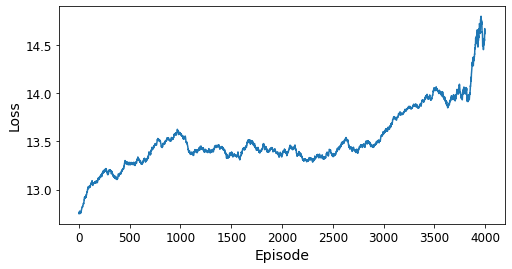

Episode: 9000, Last 100 Rewards: -6.20, Last 1000 Rewards: -6.36, Last 100 Losses: 15.732, Last 1000 Losses: 14.624            


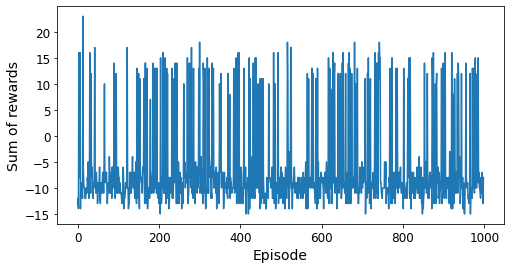

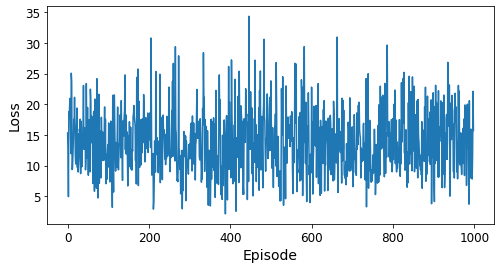

Smoothed rewards:


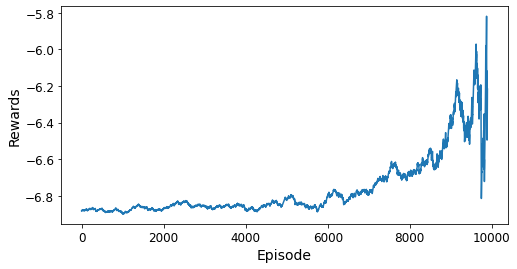

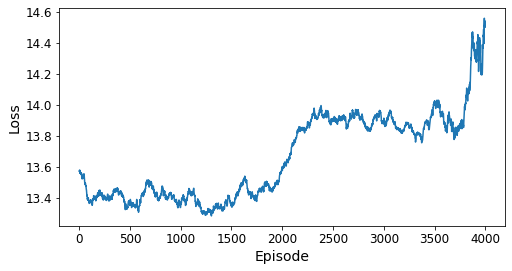

Episode: 10000, Last 100 Rewards: -8.46, Last 1000 Rewards: -7.02, Last 100 Losses: 16.023, Last 1000 Losses: 14.362            


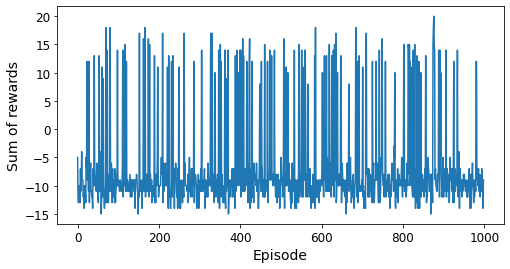

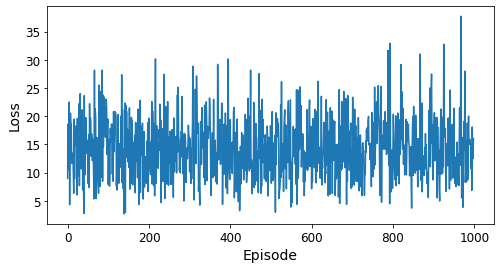

Smoothed rewards:


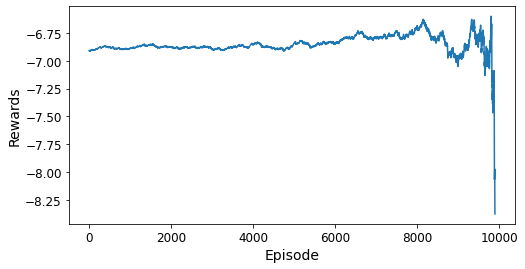

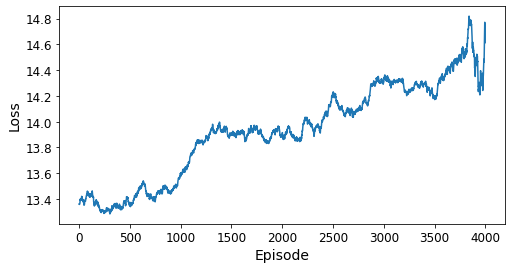

Episode: 11000, Last 100 Rewards: -5.87, Last 1000 Rewards: -7.22, Last 100 Losses: 13.492, Last 1000 Losses: 14.743            


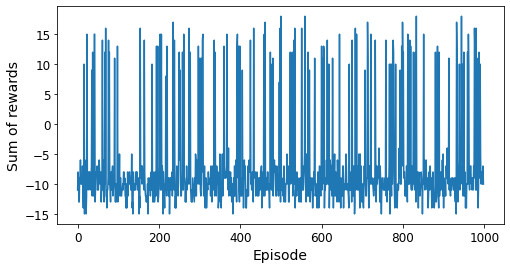

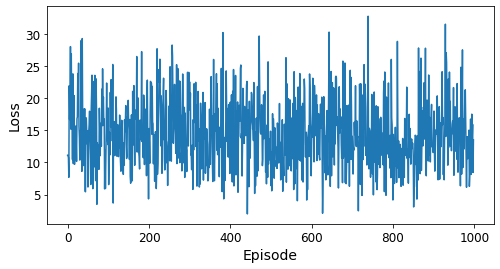

Smoothed rewards:


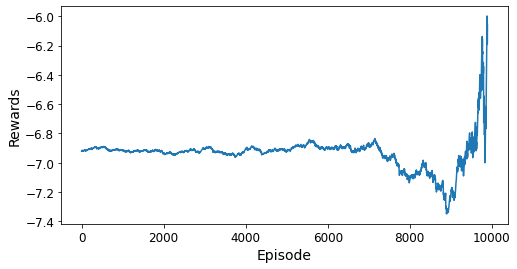

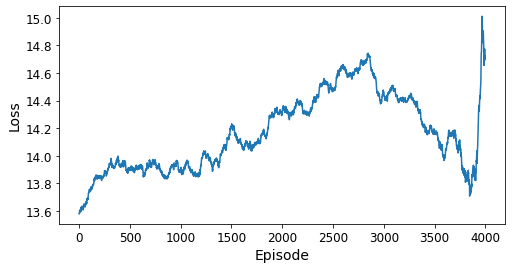

Episode: 12000, Last 100 Rewards: -6.35, Last 1000 Rewards: -6.77, Last 100 Losses: 8.210, Last 1000 Losses: 15.045            


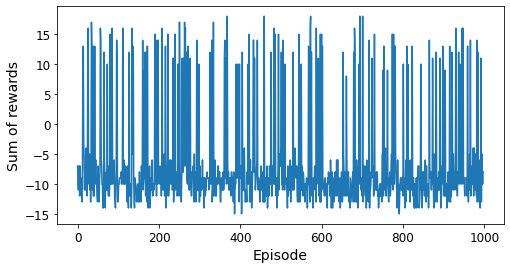

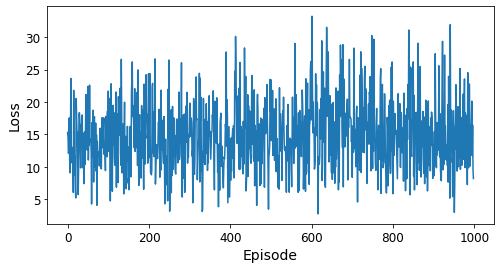

Smoothed rewards:


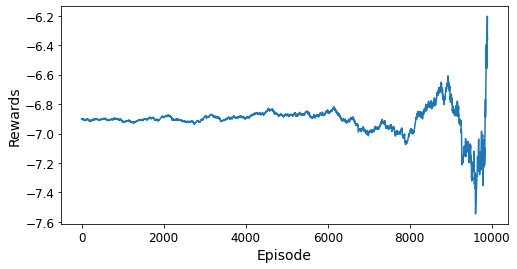

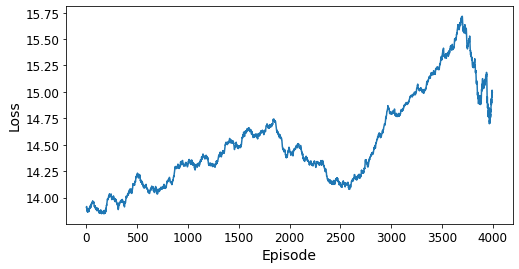

Episode: 13000, Last 100 Rewards: -6.77, Last 1000 Rewards: -7.07, Last 100 Losses: 21.974, Last 1000 Losses: 14.538            


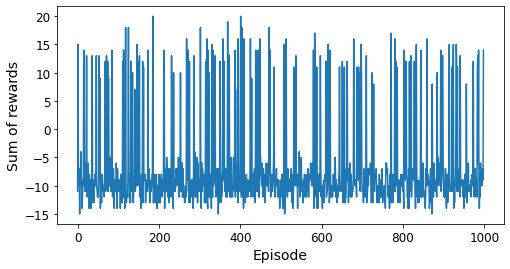

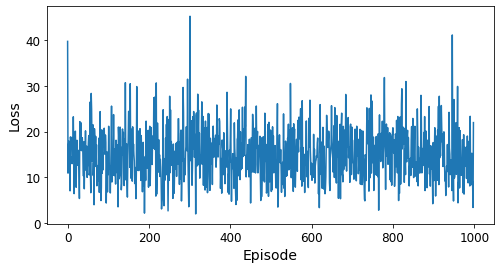

Smoothed rewards:


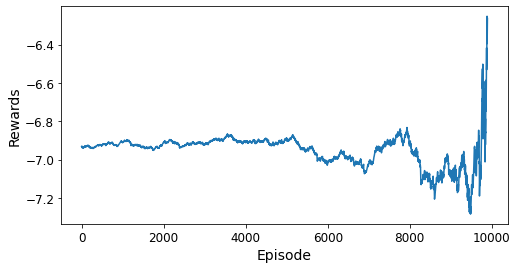

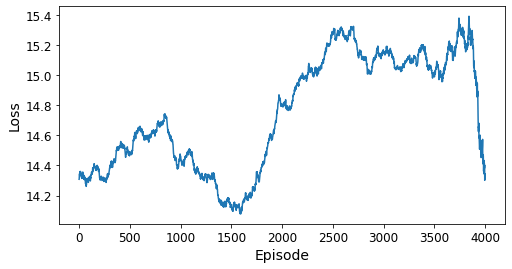

Episode: 14000, Last 100 Rewards: -7.01, Last 1000 Rewards: -7.14, Last 100 Losses: 22.716, Last 1000 Losses: 15.524            


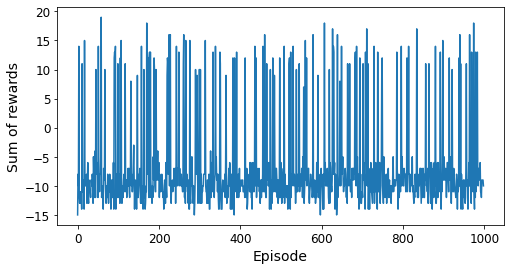

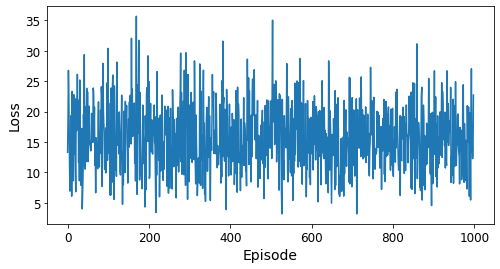

Smoothed rewards:


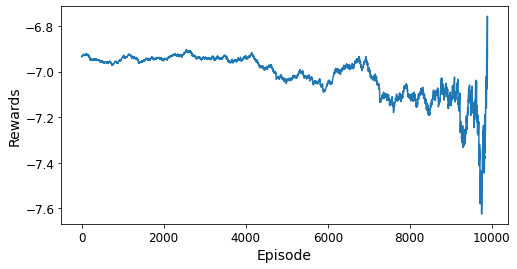

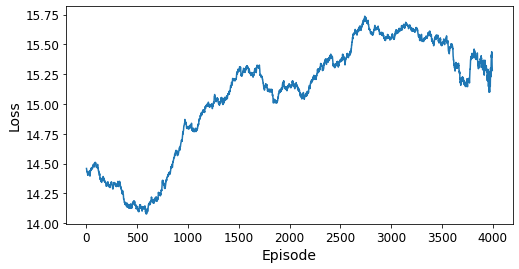

Episode: 15000, Last 100 Rewards: -6.09, Last 1000 Rewards: -6.50, Last 100 Losses: 18.938, Last 1000 Losses: 16.334            


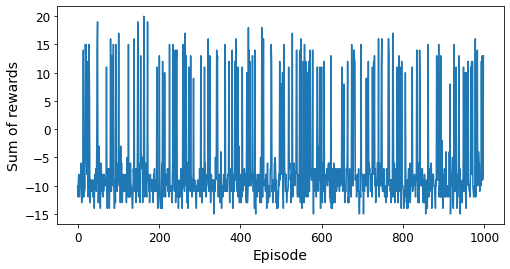

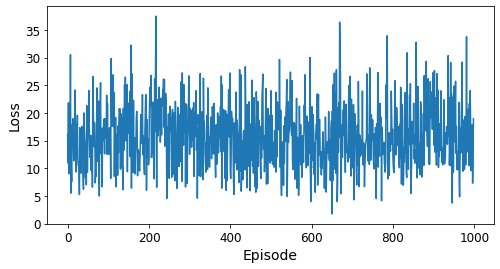

Smoothed rewards:


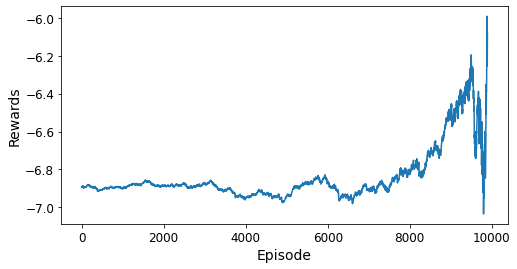

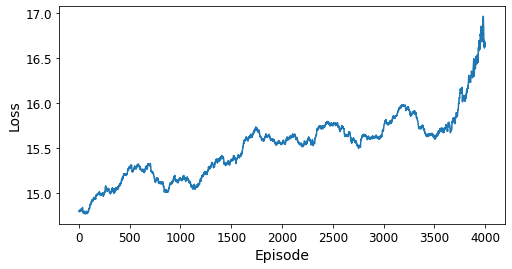

Episode: 16000, Last 100 Rewards: -8.04, Last 1000 Rewards: -6.90, Last 100 Losses: 6.472, Last 1000 Losses: 14.800            


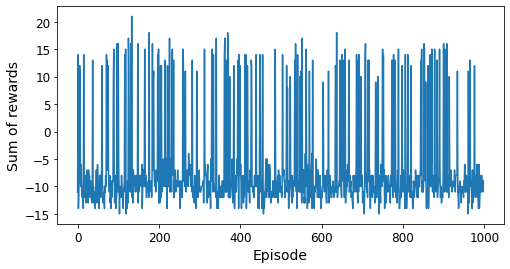

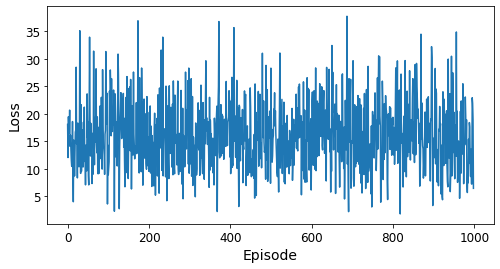

Smoothed rewards:


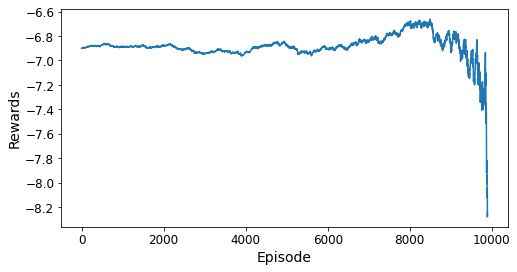

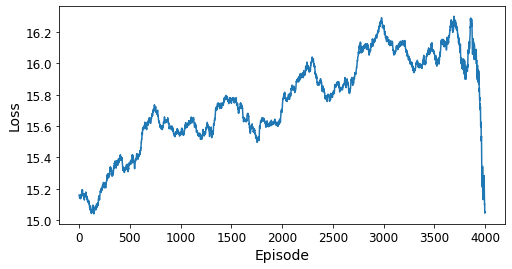

Episode: 17000, Last 100 Rewards: -6.59, Last 1000 Rewards: -6.89, Last 100 Losses: 13.681, Last 1000 Losses: 15.830            


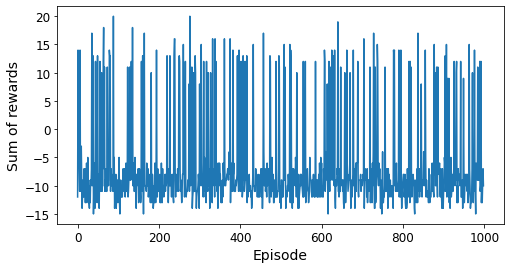

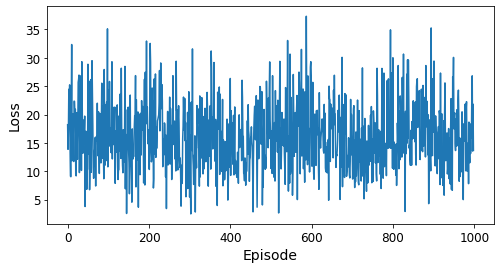

Smoothed rewards:


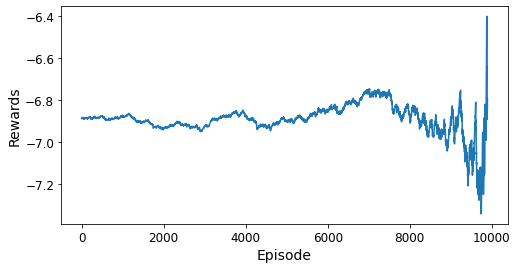

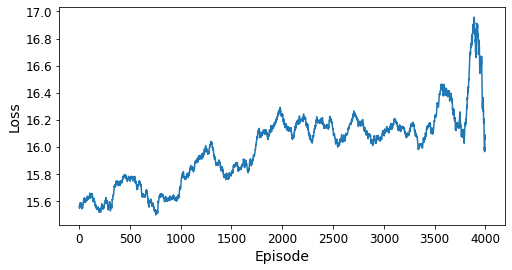

Episode: 18000, Last 100 Rewards: -6.08, Last 1000 Rewards: -6.94, Last 100 Losses: 23.672, Last 1000 Losses: 15.501            


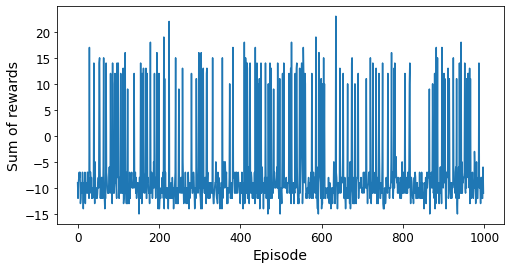

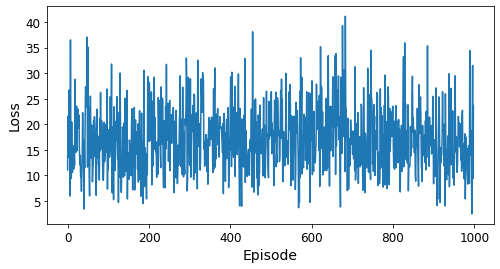

Smoothed rewards:


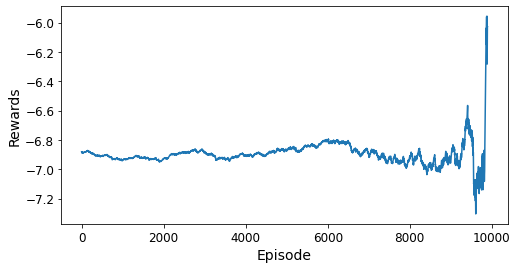

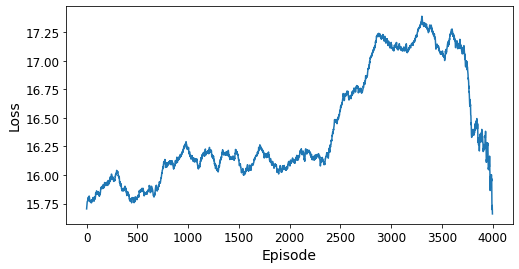

Episode: 19000, Last 100 Rewards: -7.35, Last 1000 Rewards: -7.19, Last 100 Losses: 3.791, Last 1000 Losses: 17.195            


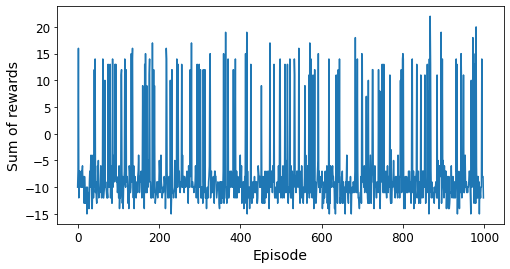

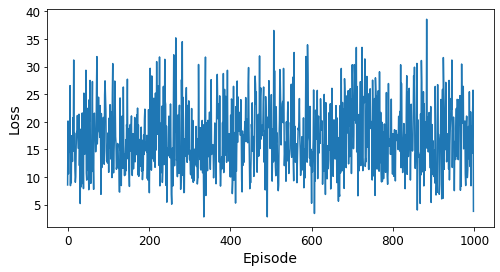

Smoothed rewards:


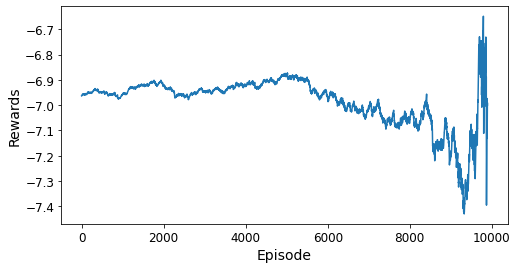

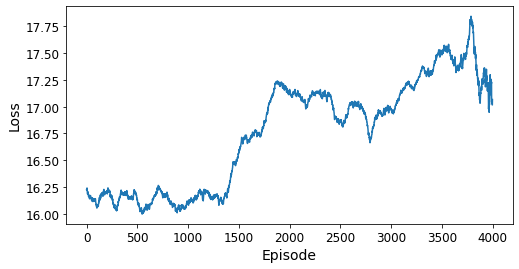

Episode: 20000, Last 100 Rewards: -4.72, Last 1000 Rewards: -6.59, Last 100 Losses: 7.265, Last 1000 Losses: 17.147            


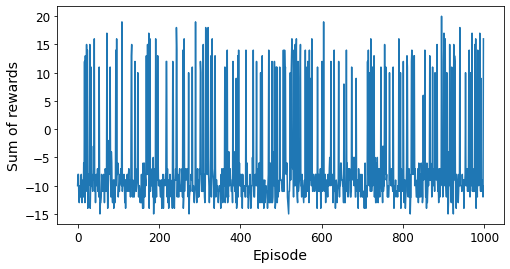

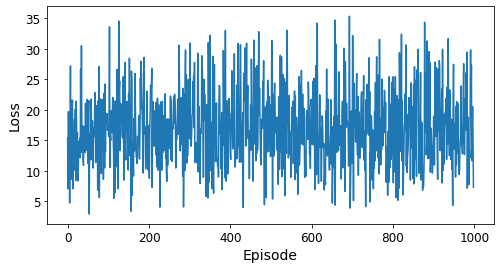

Smoothed rewards:


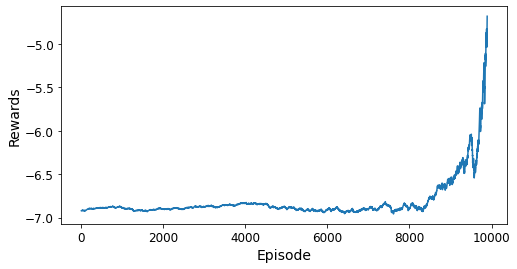

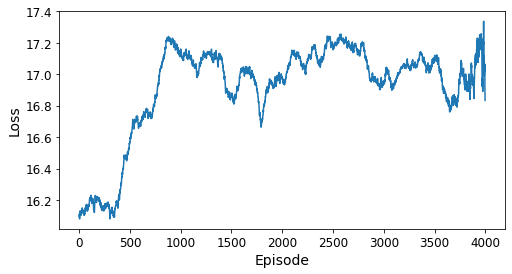

Episode: 21000, Last 100 Rewards: -5.31, Last 1000 Rewards: -6.61, Last 100 Losses: 21.012, Last 1000 Losses: 18.570            


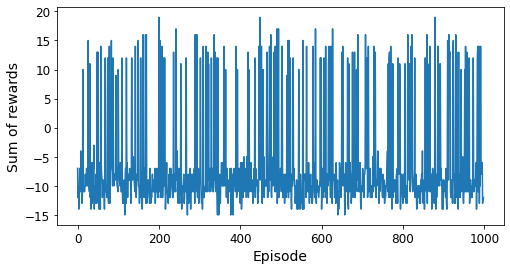

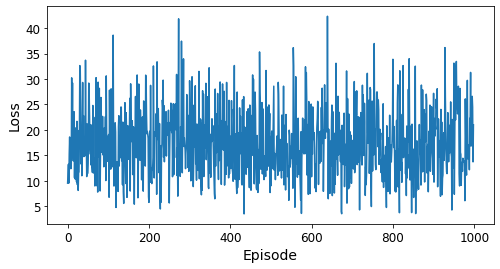

Smoothed rewards:


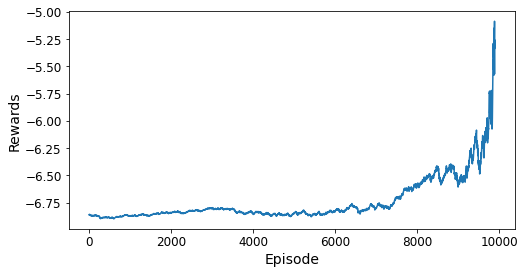

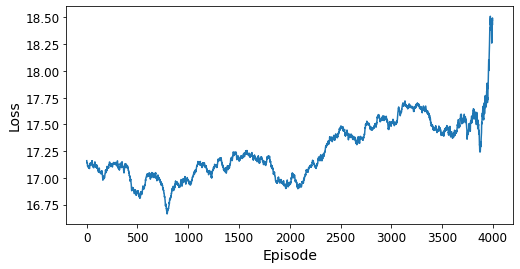

Episode: 22000, Last 100 Rewards: -7.21, Last 1000 Rewards: -7.16, Last 100 Losses: 18.776, Last 1000 Losses: 17.823            


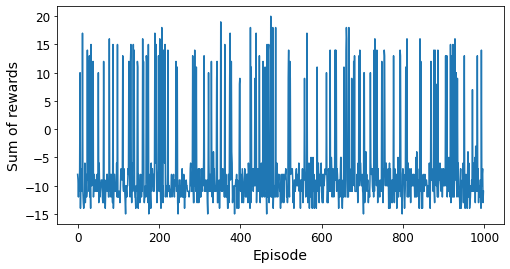

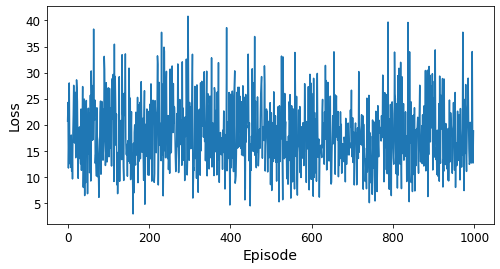

Smoothed rewards:


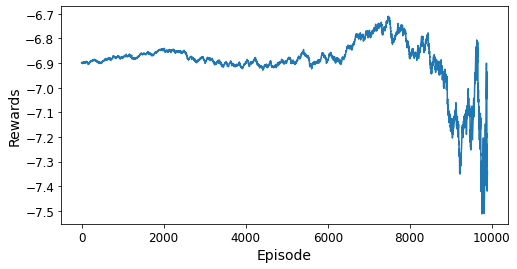

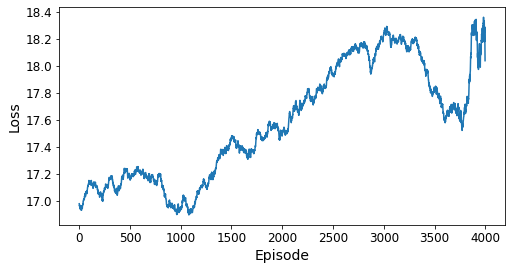

Episode: 23000, Last 100 Rewards: -6.51, Last 1000 Rewards: -6.72, Last 100 Losses: 17.069, Last 1000 Losses: 18.212            


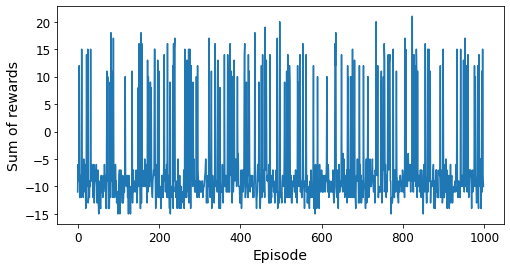

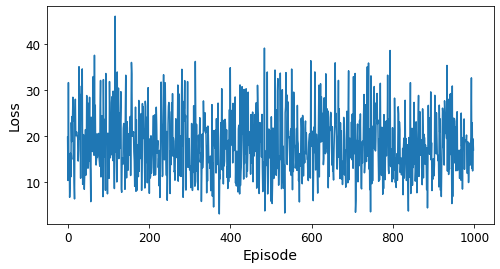

Smoothed rewards:


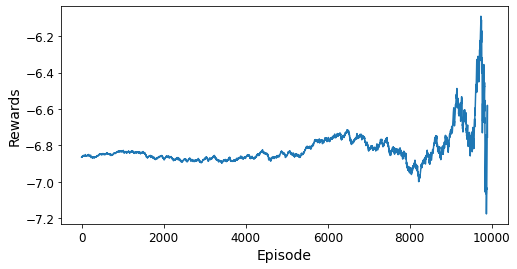

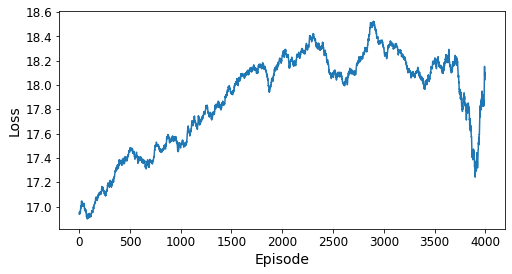

Episode: 24000, Last 100 Rewards: -6.62, Last 1000 Rewards: -6.92, Last 100 Losses: 27.341, Last 1000 Losses: 18.170            


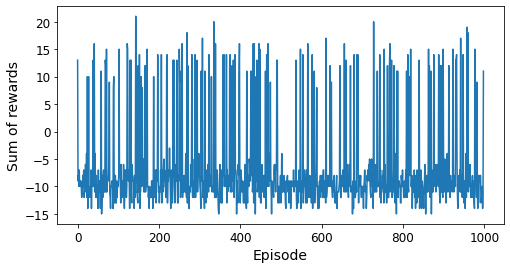

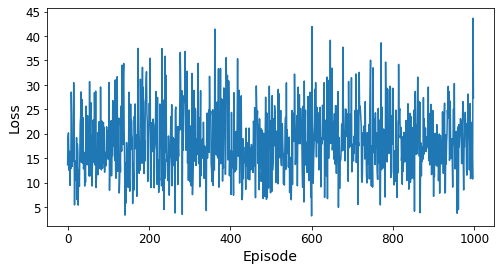

Smoothed rewards:


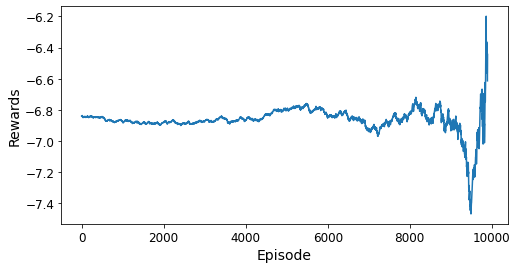

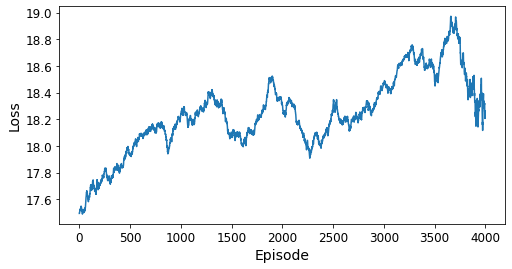

Episode: 25000, Last 100 Rewards: -6.52, Last 1000 Rewards: -6.99, Last 100 Losses: 16.862, Last 1000 Losses: 18.593            


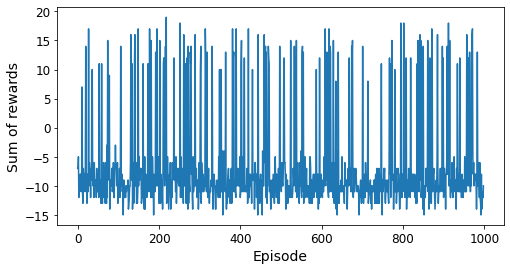

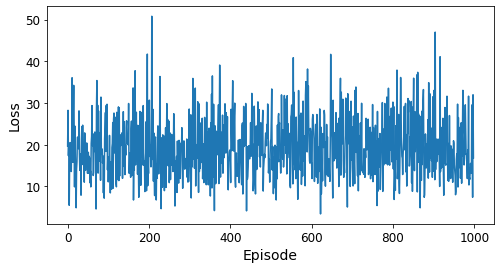

Smoothed rewards:


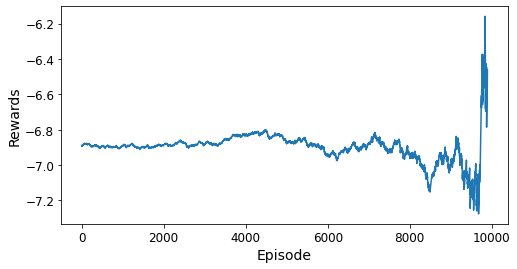

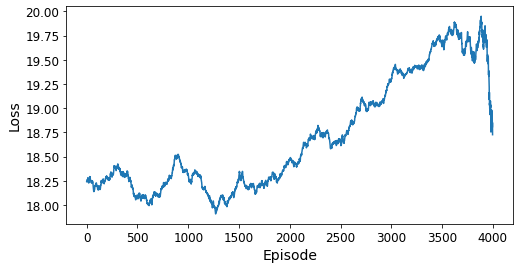

Episode: 26000, Last 100 Rewards: -7.83, Last 1000 Rewards: -7.29, Last 100 Losses: 16.580, Last 1000 Losses: 19.128            


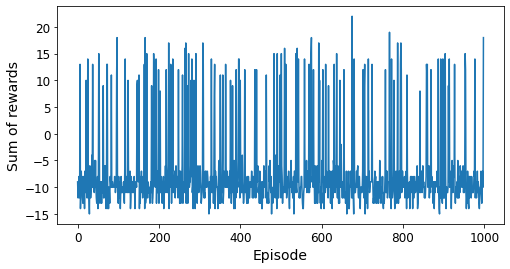

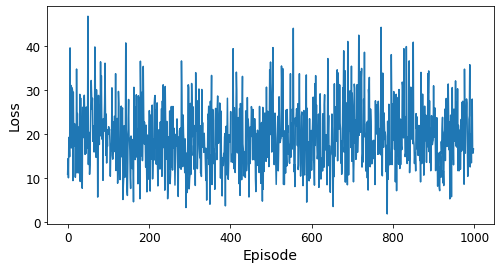

Smoothed rewards:


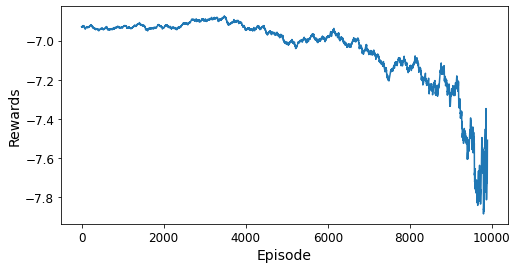

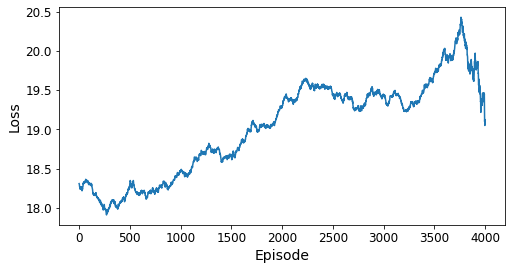

Episode: 27000, Last 100 Rewards: -6.18, Last 1000 Rewards: -6.80, Last 100 Losses: 21.476, Last 1000 Losses: 19.568            


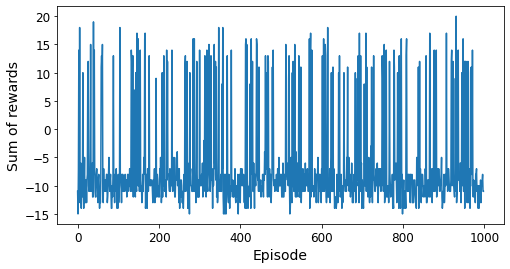

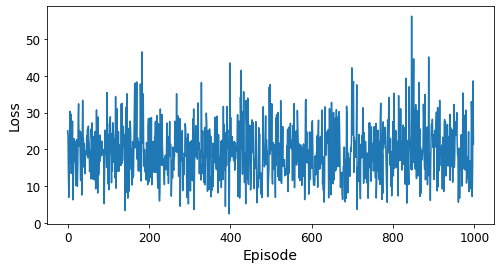

Smoothed rewards:


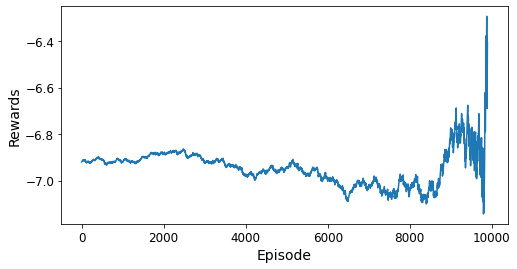

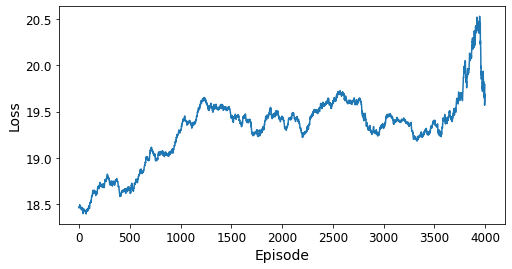

Episode: 28000, Last 100 Rewards: -6.77, Last 1000 Rewards: -6.76, Last 100 Losses: 19.875, Last 1000 Losses: 18.384            


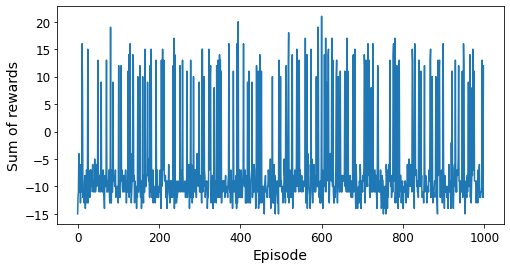

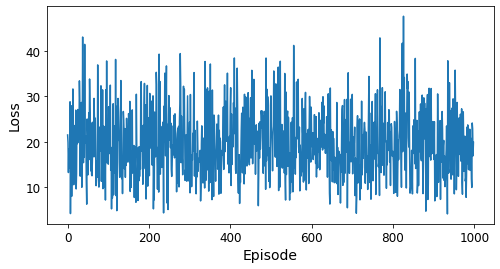

Smoothed rewards:


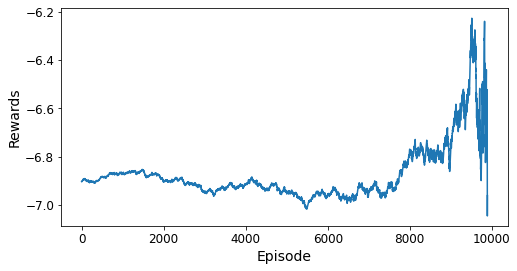

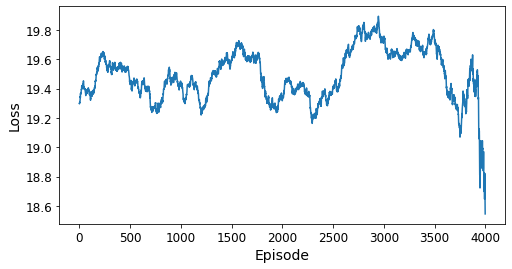

Episode: 29000, Last 100 Rewards: -7.87, Last 1000 Rewards: -6.36, Last 100 Losses: 27.597, Last 1000 Losses: 19.930            


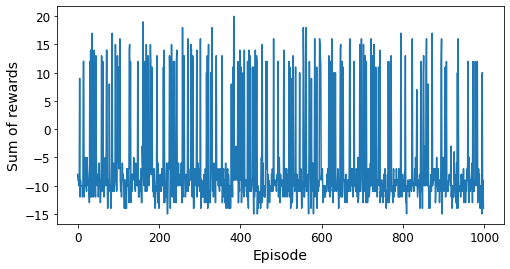

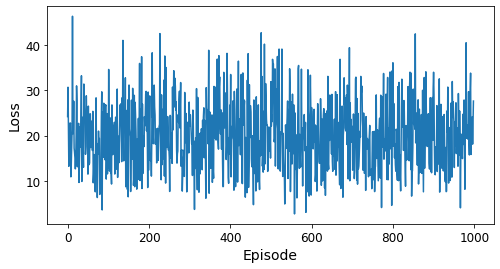

Smoothed rewards:


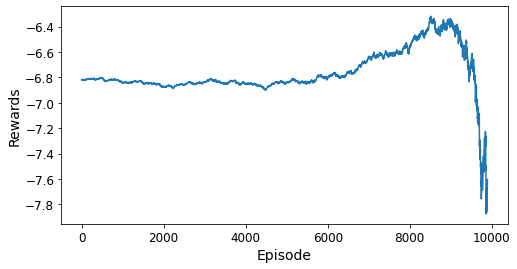

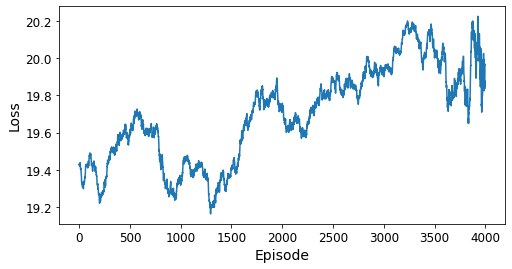

Episode: 30000, Last 100 Rewards: -6.99, Last 1000 Rewards: -6.75, Last 100 Losses: 9.542, Last 1000 Losses: 20.250            


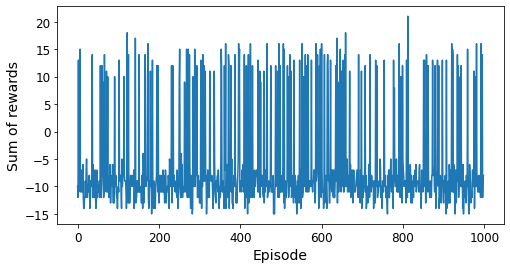

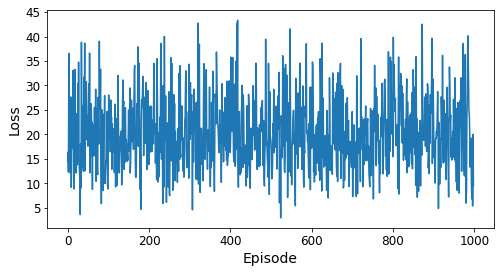

Smoothed rewards:


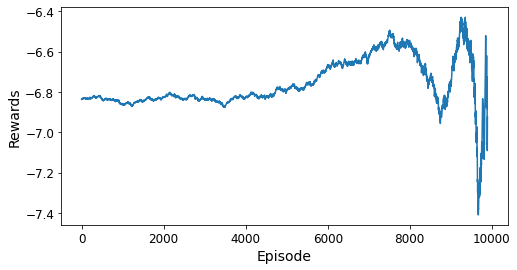

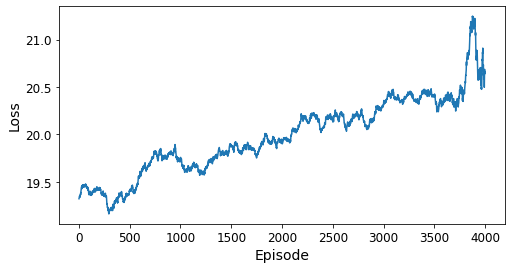

Episode: 31000, Last 100 Rewards: -6.08, Last 1000 Rewards: -7.16, Last 100 Losses: 15.085, Last 1000 Losses: 20.356            


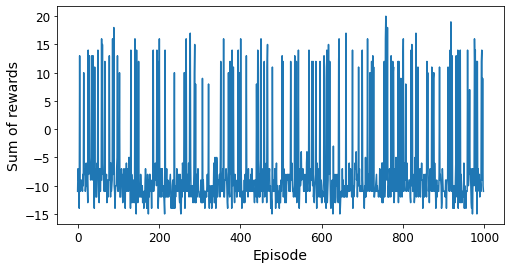

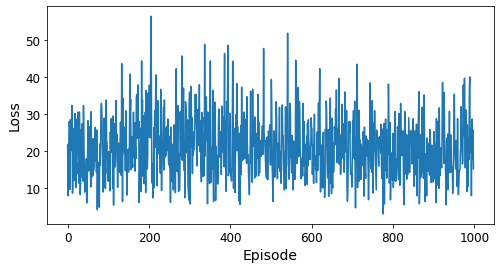

Smoothed rewards:


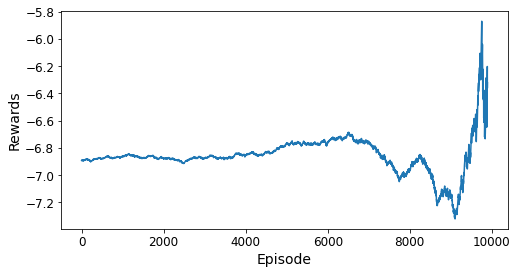

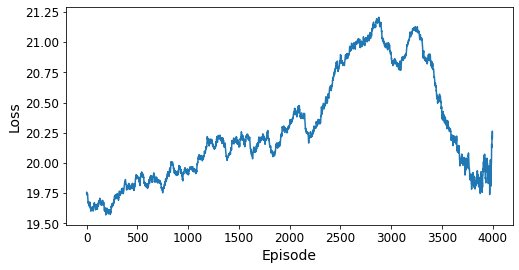

Episode: 32000, Last 100 Rewards: -6.47, Last 1000 Rewards: -6.63, Last 100 Losses: 24.143, Last 1000 Losses: 20.716            


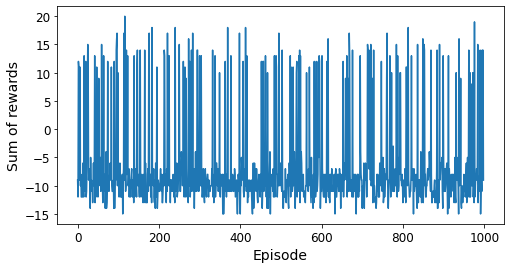

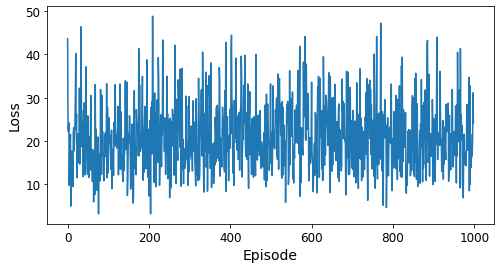

Smoothed rewards:


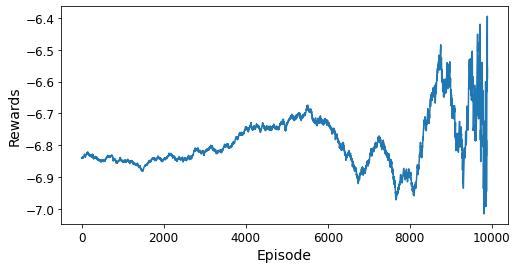

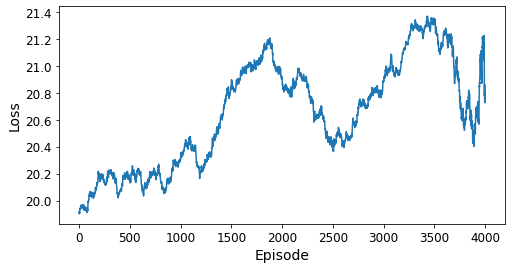

Episode: 33000, Last 100 Rewards: -7.03, Last 1000 Rewards: -6.36, Last 100 Losses: 12.405, Last 1000 Losses: 21.500            


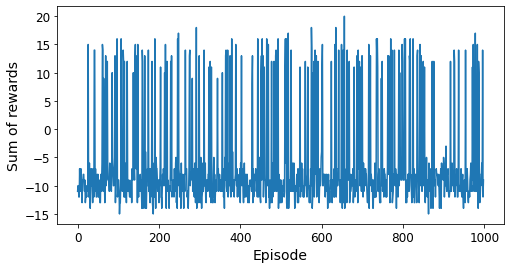

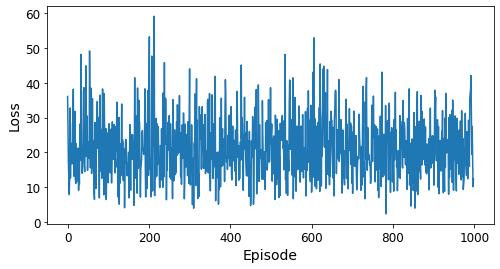

Smoothed rewards:


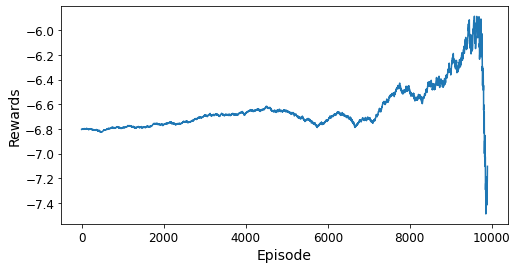

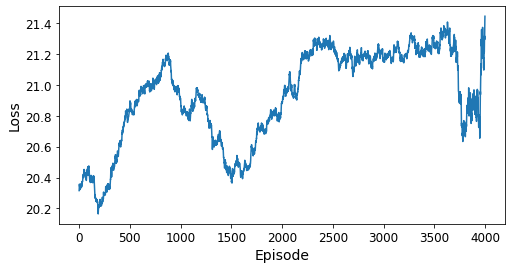

Episode: 34000, Last 100 Rewards: -5.99, Last 1000 Rewards: -7.01, Last 100 Losses: 5.413, Last 1000 Losses: 22.332            


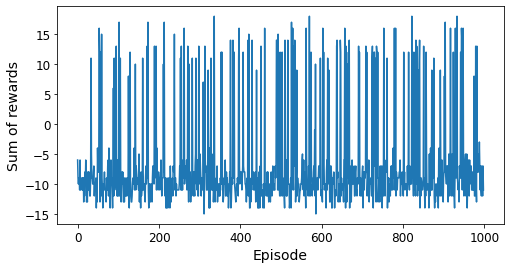

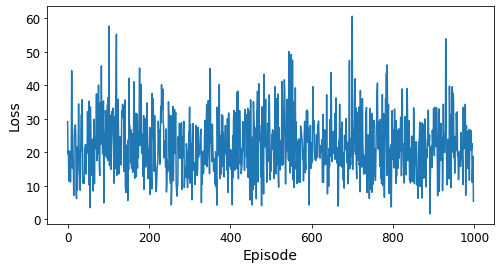

Smoothed rewards:


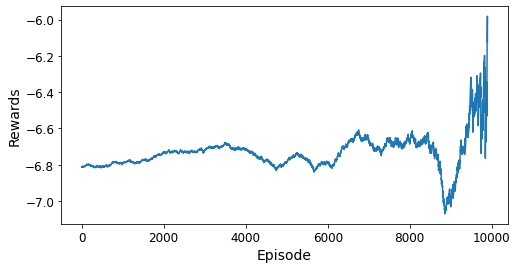

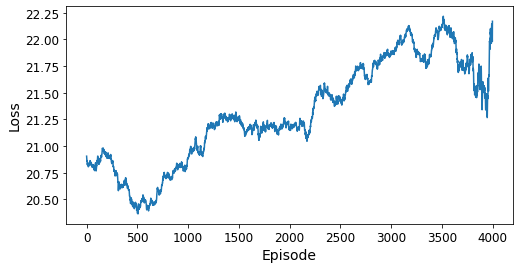

Episode: 35000, Last 100 Rewards: -7.71, Last 1000 Rewards: -6.70, Last 100 Losses: 33.723, Last 1000 Losses: 22.590            


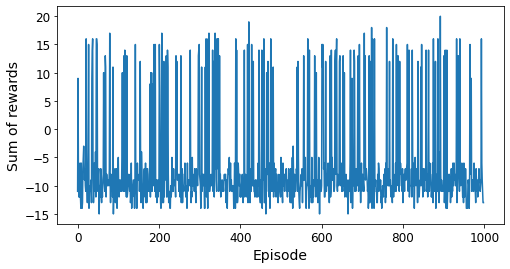

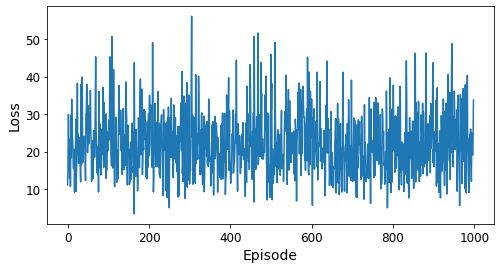

Smoothed rewards:


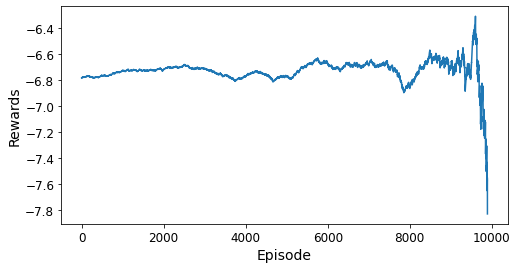

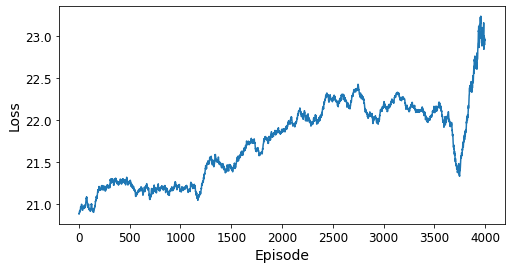

Episode: 36000, Last 100 Rewards: -6.75, Last 1000 Rewards: -6.49, Last 100 Losses: 26.878, Last 1000 Losses: 22.745            


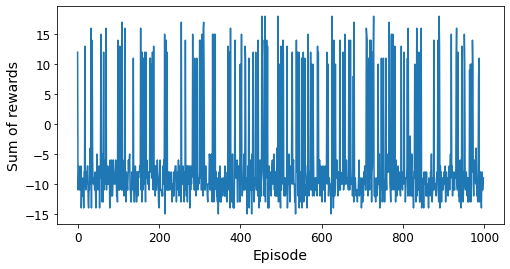

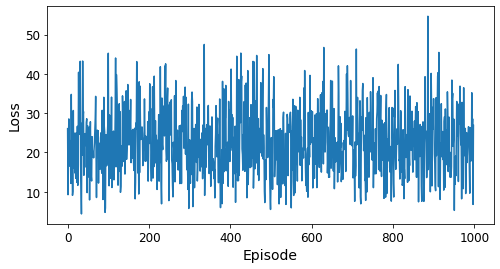

Smoothed rewards:


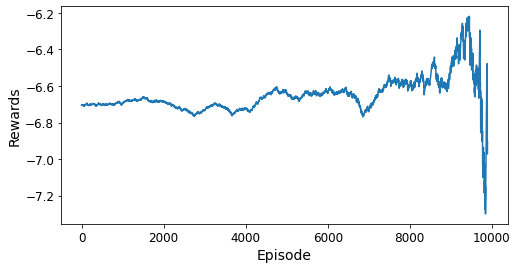

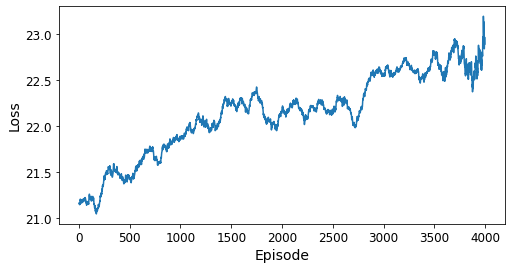

Episode: 37000, Last 100 Rewards: -7.82, Last 1000 Rewards: -6.80, Last 100 Losses: 26.916, Last 1000 Losses: 26.810            


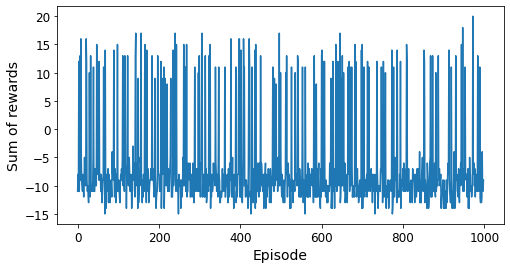

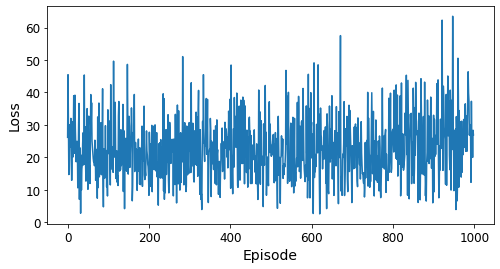

Smoothed rewards:


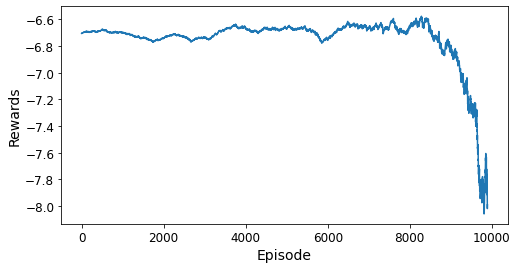

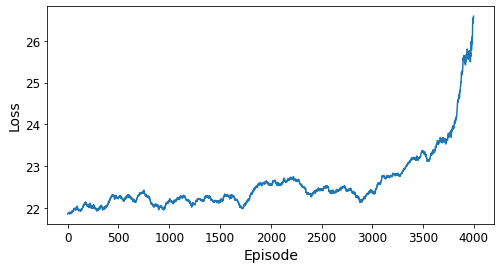

Episode: 38000, Last 100 Rewards: -5.24, Last 1000 Rewards: -6.97, Last 100 Losses: 25.793, Last 1000 Losses: 24.076            


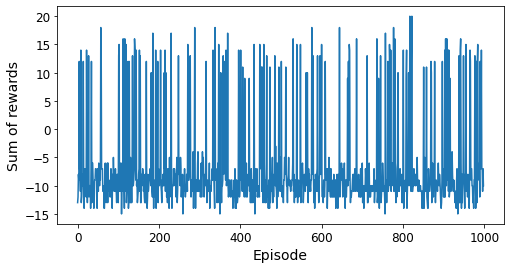

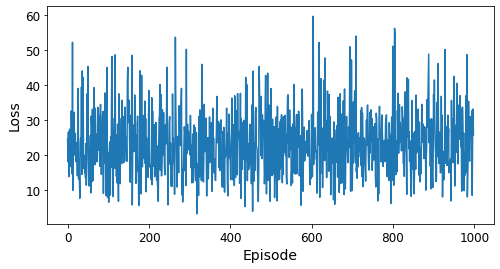

Smoothed rewards:


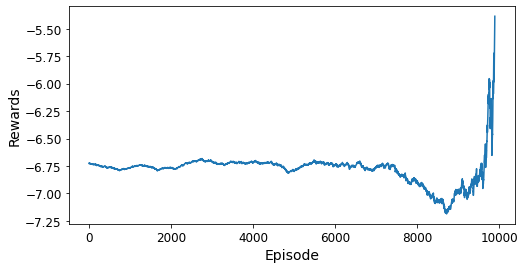

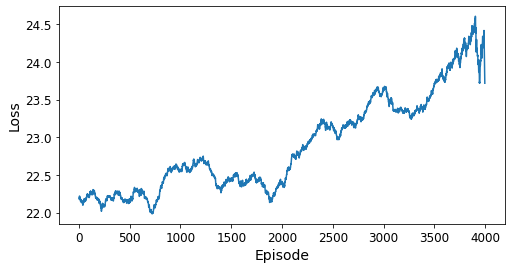

Episode: 39000, Last 100 Rewards: -7.55, Last 1000 Rewards: -6.82, Last 100 Losses: 11.199, Last 1000 Losses: 24.752            


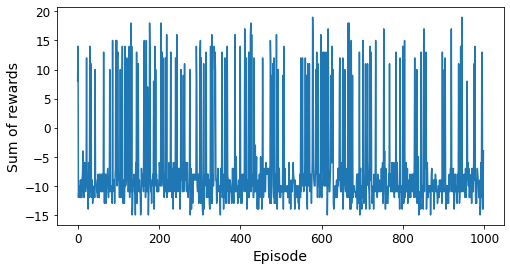

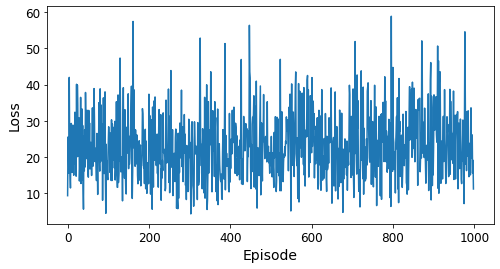

Smoothed rewards:


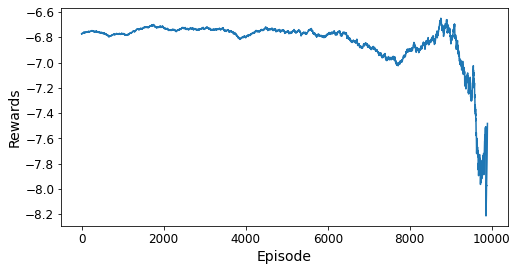

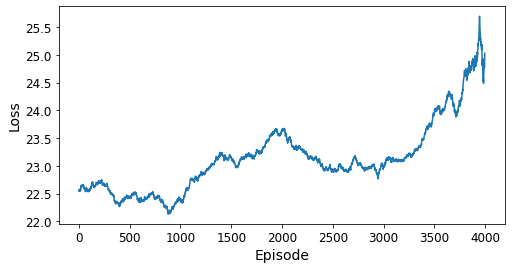

Episode: 40000, Last 100 Rewards: -6.69, Last 1000 Rewards: -6.62, Last 100 Losses: 19.551, Last 1000 Losses: 22.691            


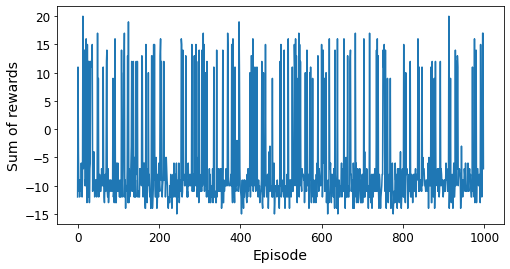

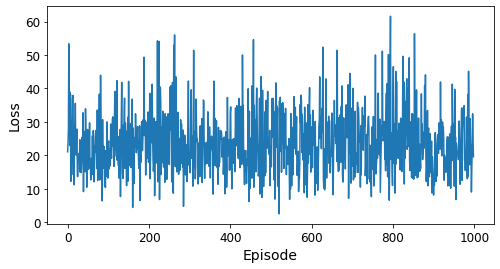

Smoothed rewards:


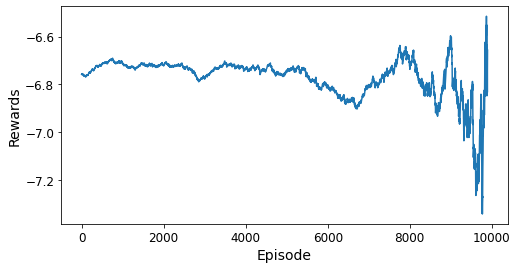

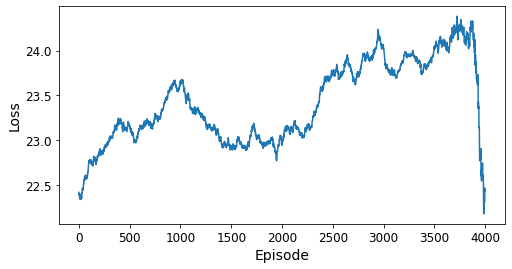

Episode: 41000, Last 100 Rewards: -6.31, Last 1000 Rewards: -7.17, Last 100 Losses: 26.628, Last 1000 Losses: 23.538            


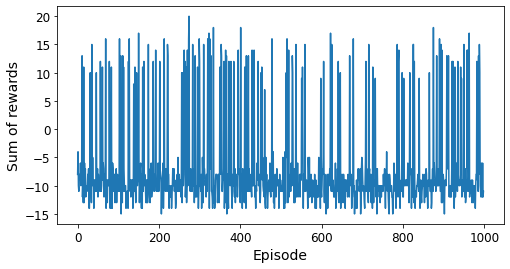

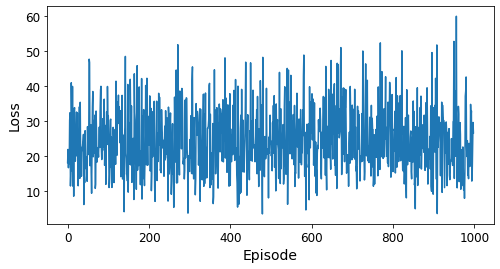

Smoothed rewards:


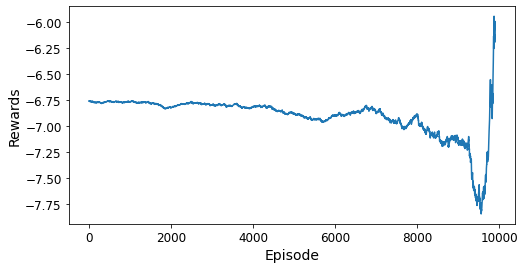

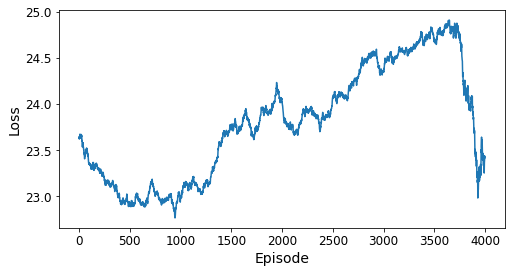

Episode: 42000, Last 100 Rewards: -7.60, Last 1000 Rewards: -6.71, Last 100 Losses: 18.901, Last 1000 Losses: 23.474            


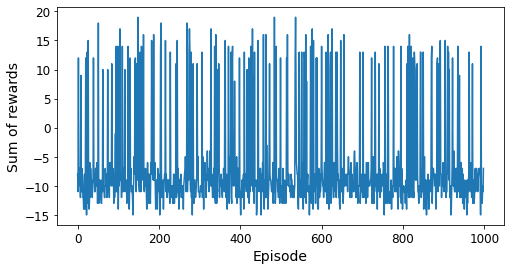

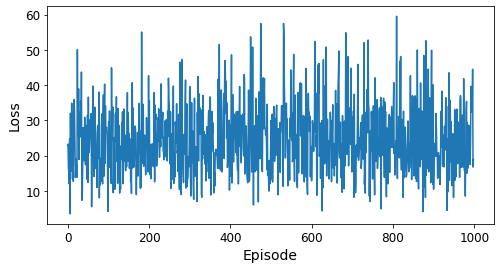

Smoothed rewards:


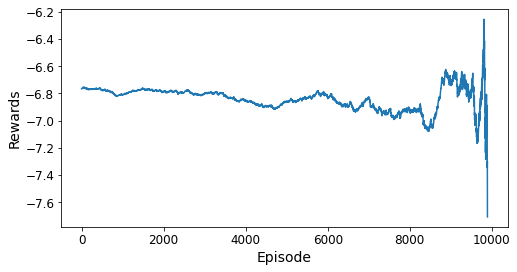

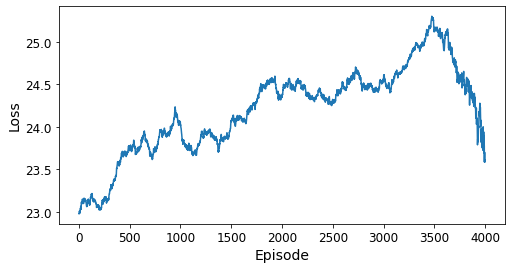

Episode: 43000, Last 100 Rewards: -5.90, Last 1000 Rewards: -6.57, Last 100 Losses: 24.380, Last 1000 Losses: 25.108            


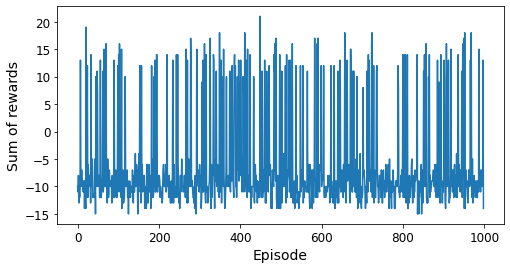

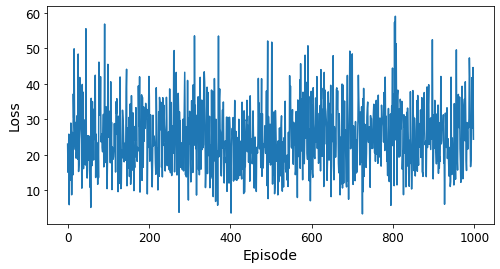

Smoothed rewards:


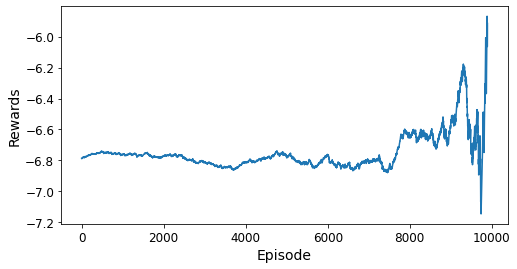

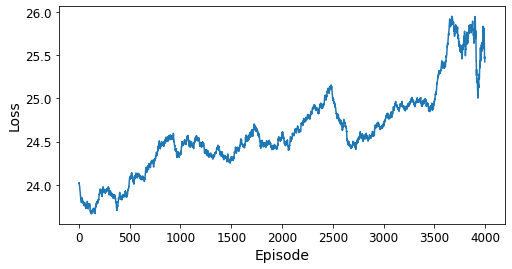

Episode: 44000, Last 100 Rewards: -6.83, Last 1000 Rewards: -6.76, Last 100 Losses: 25.723, Last 1000 Losses: 24.973            


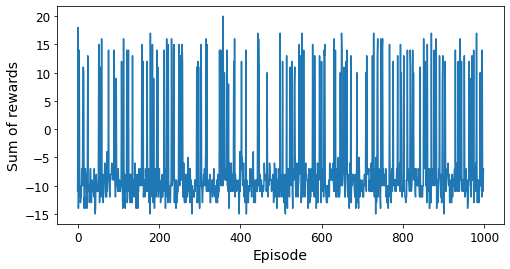

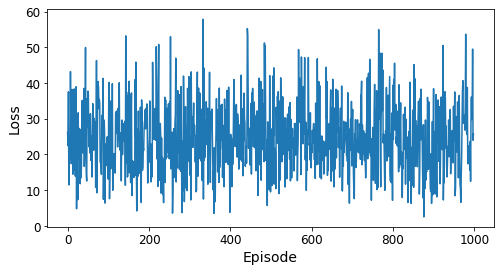

Smoothed rewards:


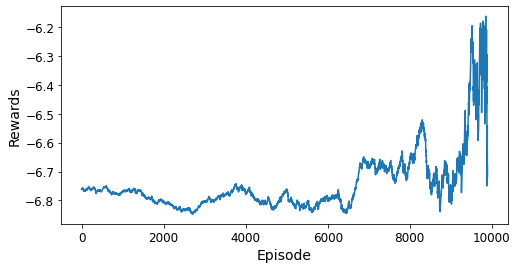

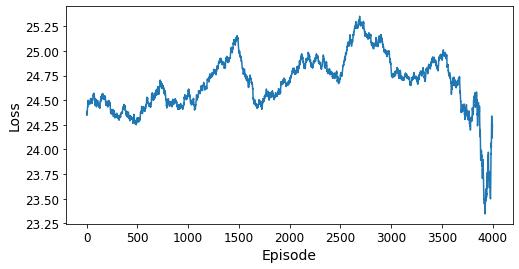

Episode: 45000, Last 100 Rewards: -5.93, Last 1000 Rewards: -7.18, Last 100 Losses: 22.222, Last 1000 Losses: 24.719            


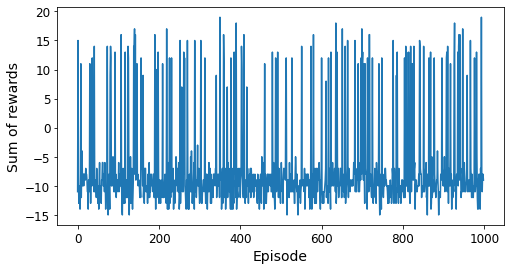

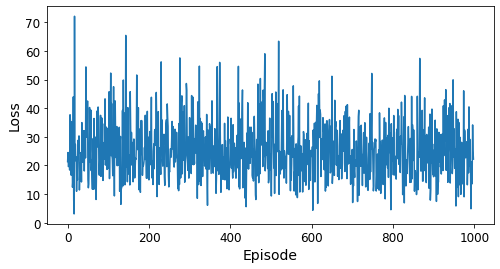

Smoothed rewards:


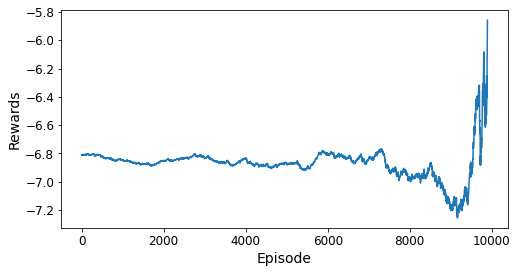

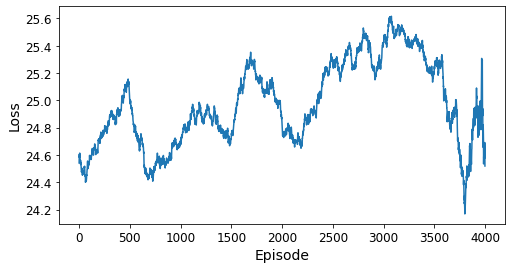

Episode: 45680, Reward: -9, Mean last 100 Rewards: -5.78, Loss: 30.351, Mean last 100 Losses: 26.344, eps: 0.00                               

KeyboardInterrupt: ignored

In [226]:
for episode in range(100000):
    
    obs = env.reset()  
    rew_per_ep=0

    for step in range(200):
        epsilon = 0 #max(1 - episode / 500, 0.01)
        obs, guessed, reward, done, info = play_one_step(env, obs, env.guessed, epsilon)
        rew_per_ep+=reward
        if done:
            break
    
    rewards.append(rew_per_ep)

    loss=0
    if episode >= 50:
        loss=training_step(batch_size)
        losses.append(loss)
        if episode % 200 == 0:
            target.set_weights(full_model.get_weights())
            
    print('\r','\rEpisode: {}, Reward: {}, Mean last 100 Rewards: {:.2f}, Loss: {:.3f}, Mean last 100 Losses: {:.3f}, eps: {:.2f}'\
    '            '.format(episode, rew_per_ep, np.mean(rewards[-100:]), loss, np.mean(losses[-100:]), epsilon),\
                  end="                   ") 
    
    if episode>0 and episode%1000==0:
      
      print('\r','\rEpisode: {}, Last 100 Rewards: {:.2f}, Last 1000 Rewards: {:.2f}, Last 100 Losses: {:.3f}, Last 1000 Losses: {:.3f}'\
    '            '.format(episode, np.mean(rewards[-100:]), np.mean(rewards[-1000:]), loss, np.mean(losses[-100:]), np.mean(losses[-1000:])),\
                  end="") 
      print()

      plt.figure(figsize=(8, 4))
      plt.plot(rewards[-999:])
      plt.xlabel("Episode", fontsize=14)
      plt.ylabel("Sum of rewards", fontsize=14)
      plt.show()

      plt.figure(figsize=(8, 4))
      plt.plot(losses[-999:])
      plt.xlabel("Episode", fontsize=14)
      plt.ylabel("Loss", fontsize=14)
      plt.show()

      #full_model.save('./drive/MyDrive/RI_DDDQL_large.h5', include_optimizer=True)

      print('Smoothed rewards:')
      
      rwd_smooth=[np.mean(rewards[i:i+1000]) for i in range(len(rewards)-10000,len(rewards)-105)]
      losses_smooth=[np.mean(losses[i:i+1000]) for i in range(len(losses)-10000,len(losses)-105)]
      #
      plt.figure(figsize=(8, 4))
      plt.plot(rwd_smooth)
      plt.xlabel("Episode", fontsize=14)
      plt.ylabel("Rewards", fontsize=14)
      plt.show()
      #
      plt.figure(figsize=(8, 4))
      plt.plot(losses_smooth[-4000:-1])
      plt.xlabel("Episode", fontsize=14)
      plt.ylabel("Loss", fontsize=14)
      plt.show()


In [228]:
ws,ls,gs=0,0,0
test_env = Hangman('test_words.txt'\
              , max_lives = 6, verbose = False)

tot_trials=100

for i in range(tot_trials):
    test_done = False
    test_obs = test_env.reset()
    j=0

    while not test_done:
        j+=1
        inp1=np.array([state_to_input(test_obs)])
        inp2=np.array([guess_to_input(test_env.guessed)])

        action_proba = full_model([inp1,inp2])
        sorted_proba=np.argsort(-np.array(action_proba))[0]
        for it in sorted_proba:
            if alphabet[it] not in test_env.guessed:
                action_guess=alphabet[it]
                break      
        
        test_obs, test_rwd , test_done , test_wrd = test_env.step(action_guess)

    if test_rwd==10: ws+=1
    if test_rwd==-10: ls+=1
    gs+=1
    print('\r   Games: {}, Wins: {}, Losses: {}, Win percentage: {:.3f}    '.format(gs,ws,ls,ws/games), end="")

   Games: 100, Wins: 10, Losses: 90, Win percentage: 0.100    

In [229]:
env = Hangman('words_250000_train.txt' , max_lives = 6, verbose = False,
              win_reward = 6,
              correct_reward = 5,
              repeated_guessing_penalty = -100,
              lose_reward = -10, 
              false_reward = -5)

In [230]:
rewards,losses,best_score = [],[],0

/usr/local/lib/python3.8/dist-packages/numpy/core/fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.8/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Episode: 49, Reward: 26, Mean last 100 Rewards: -2.62, Loss: 0.000, Mean last 100 Losses: nan, eps: 0.00                               

<ipython-input-198-c9036c019d7f>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([experience[field_index] for experience in batch])


Episode: 1000, Last 100 Rewards: -3.83, Last 1000 Rewards: -5.79, Last 100 Losses: 42.300, Last 1000 Losses: 44.389            


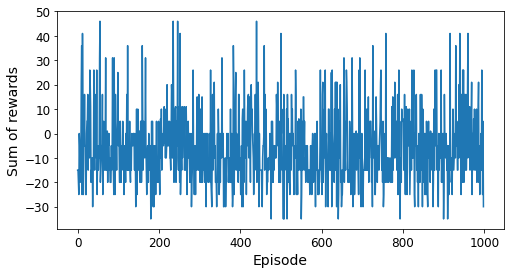

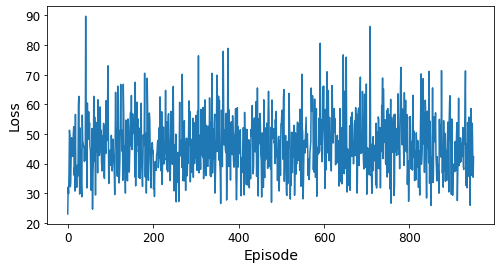

Smoothed rewards:


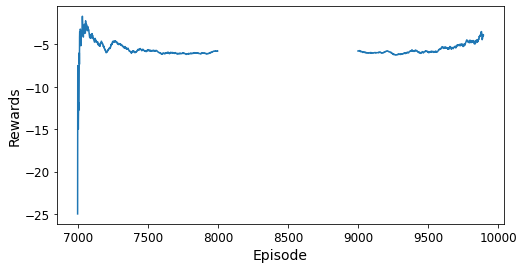

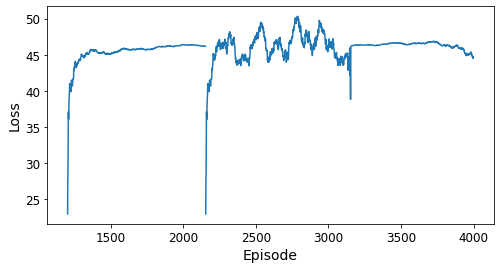

Episode: 2000, Last 100 Rewards: -6.54, Last 1000 Rewards: -5.67, Last 100 Losses: 61.929, Last 1000 Losses: 50.283            


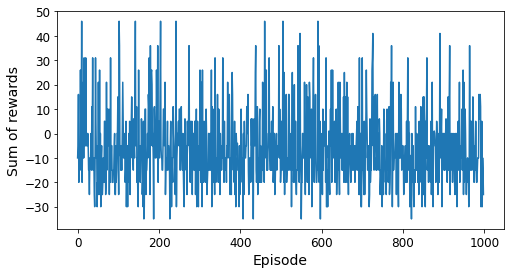

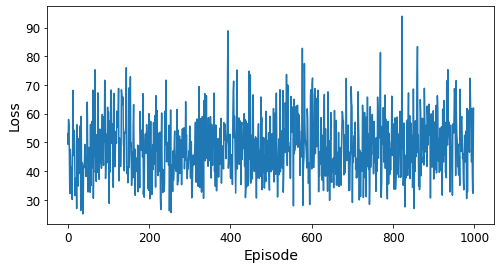

Smoothed rewards:


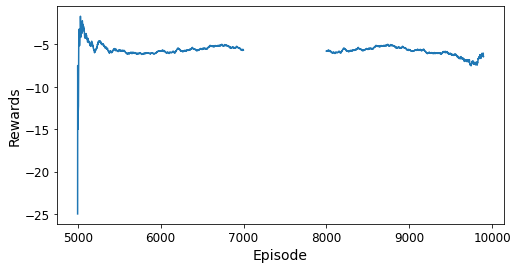

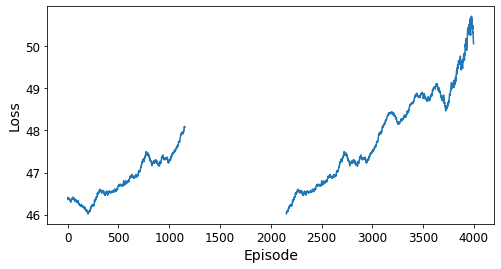

Episode: 3000, Last 100 Rewards: -5.38, Last 1000 Rewards: -5.23, Last 100 Losses: 43.992, Last 1000 Losses: 48.727            


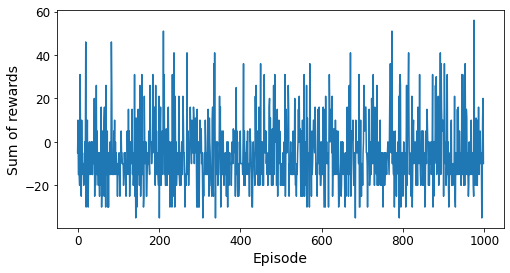

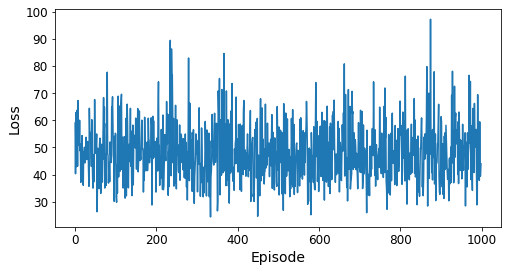

Smoothed rewards:


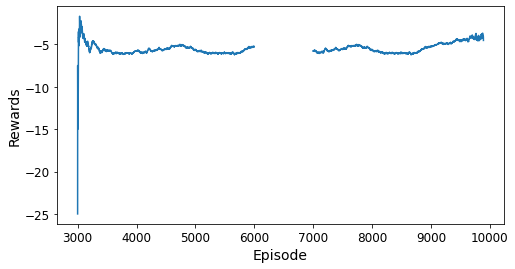

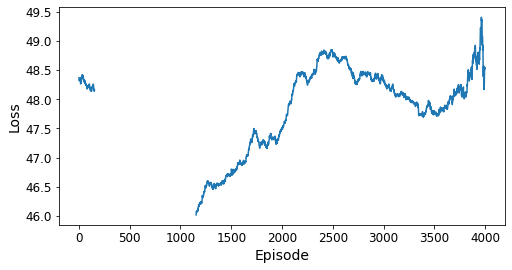

Episode: 4000, Last 100 Rewards: -4.82, Last 1000 Rewards: -6.27, Last 100 Losses: 54.490, Last 1000 Losses: 50.268            


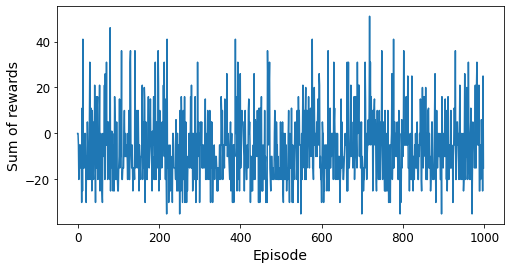

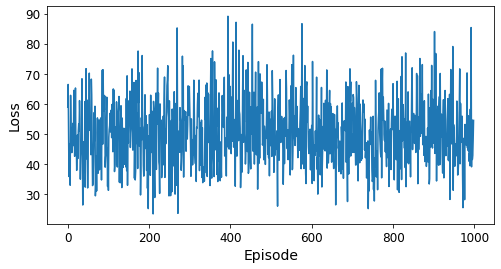

Smoothed rewards:


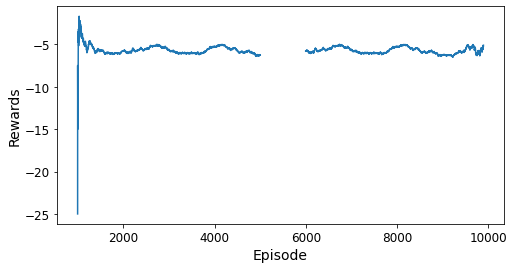

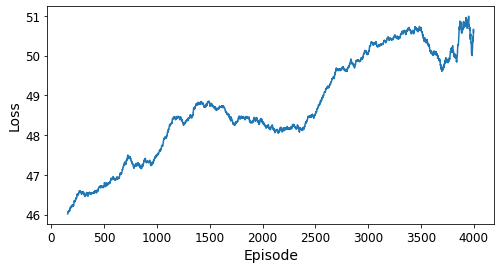

Episode: 4684, Reward: 5, Mean last 100 Rewards: -4.32, Loss: 54.732, Mean last 100 Losses: 51.887, eps: 0.00                               

In [ ]:
for episode in range(100000):
    
    obs = env.reset()  
    rew_per_ep=0

    for step in range(200):
        epsilon = 0 #max(1 - episode / 500, 0.01)
        obs, guessed, reward, done, info = play_one_step(env, obs, env.guessed, epsilon)
        rew_per_ep+=reward
        if done:
            break
    
    rewards.append(rew_per_ep)

    loss=0
    if episode >= 50:
        loss=training_step(batch_size)
        losses.append(loss)
        if episode % 200 == 0:
            target.set_weights(full_model.get_weights())
            
    print('\r','\rEpisode: {}, Reward: {}, Mean last 100 Rewards: {:.2f}, Loss: {:.3f}, Mean last 100 Losses: {:.3f}, eps: {:.2f}'\
    '            '.format(episode, rew_per_ep, np.mean(rewards[-100:]), loss, np.mean(losses[-100:]), epsilon),\
                  end="                   ") 
    
    if episode>0 and episode%1000==0:
      
      print('\r','\rEpisode: {}, Last 100 Rewards: {:.2f}, Last 1000 Rewards: {:.2f}, Last 100 Losses: {:.3f}, Last 1000 Losses: {:.3f}'\
    '            '.format(episode, np.mean(rewards[-100:]), np.mean(rewards[-1000:]), loss, np.mean(losses[-100:]), np.mean(losses[-1000:])),\
                  end="") 
      print()

      plt.figure(figsize=(8, 4))
      plt.plot(rewards[-999:])
      plt.xlabel("Episode", fontsize=14)
      plt.ylabel("Sum of rewards", fontsize=14)
      plt.show()

      plt.figure(figsize=(8, 4))
      plt.plot(losses[-999:])
      plt.xlabel("Episode", fontsize=14)
      plt.ylabel("Loss", fontsize=14)
      plt.show()

      #full_model.save('./drive/MyDrive/RI_DDDQL_large.h5', include_optimizer=True)

      print('Smoothed rewards:')
      
      rwd_smooth=[np.mean(rewards[i:i+1000]) for i in range(len(rewards)-10000,len(rewards)-105)]
      losses_smooth=[np.mean(losses[i:i+1000]) for i in range(len(losses)-10000,len(losses)-105)]
      #
      plt.figure(figsize=(8, 4))
      plt.plot(rwd_smooth)
      plt.xlabel("Episode", fontsize=14)
      plt.ylabel("Rewards", fontsize=14)
      plt.show()
      #
      plt.figure(figsize=(8, 4))
      plt.plot(losses_smooth[-4000:-1])
      plt.xlabel("Episode", fontsize=14)
      plt.ylabel("Loss", fontsize=14)
      plt.show()

# Random Testing:

In [ ]:
ws,ls,gs=0,0,0
env = Hangman('test_words.txt'\
              , max_lives = 6, verbose = False)
remguess,totwin,words,overall_rwd,tot_trials=[],[],0,300

for i in range(tot_trials):
    done = False
    obs = env.reset()
    j,tot_rwd=0,0

    while not done and j<50:
        j+=1
        inp1=np.array([state_to_input(obs)])
        inp2=np.array([guess_to_input(env.guessed)])
        action_proba = full_model([inp1,inp2])
        sorted_proba=np.argsort(-np.array(action_proba))[0]
        for it in sorted_proba:
            if alphabet[it] not in env.guessed:
                action_guess=alphabet[it]
                break      
        #print(action_guess,end='\r')
        obs, rwd , done , wrd = env.step(action_guess)
        tot_rwd+=rwd
#        print('Guessing:', action_guess,obs,'      reward:', rwd)
#    print('total reward:',tot_rwd)
    if rwd==10: ws+=1
    if rwd==-10: ls+=1
    gs+=1
    print('\r   Games: {}, Wins: {}, Losses: {}, Win percentage: {:.3f}    '.format(gs,ws,ls,ws/games), end="")
#    overall_rwd+=tot_rwd
#    totwin.append(rwd)
#    words.append(wrd)
#    remguess.append(env.curr_live)
#print('Mean Reward over all {} trials: {:.1f}'.format(tot_trials,\
#overall_rwd/tot_trials), end='\r')
#    print(i+1,sum(item//30 for item in totwin),sum(item//30 for item in totwin)/(i+1),'',end = "\r")

   Games: 300, Wins: 50, Losses: 250, Win percentage: 0.167    

In [ ]:
print('Games: {}, Wins: {}, Losses: {}, Win percentage: {:.3f}    '.format(games,wins,losses,wins/games))